<h1 style='text-align:center; color:'#007BFF'><b>Travel Insurance - Capstone Project 3</b></h1>
<h5 style="text-align: center;"> Muhammad Hafizh Bayhaqi [JCDS-2704]</h2>

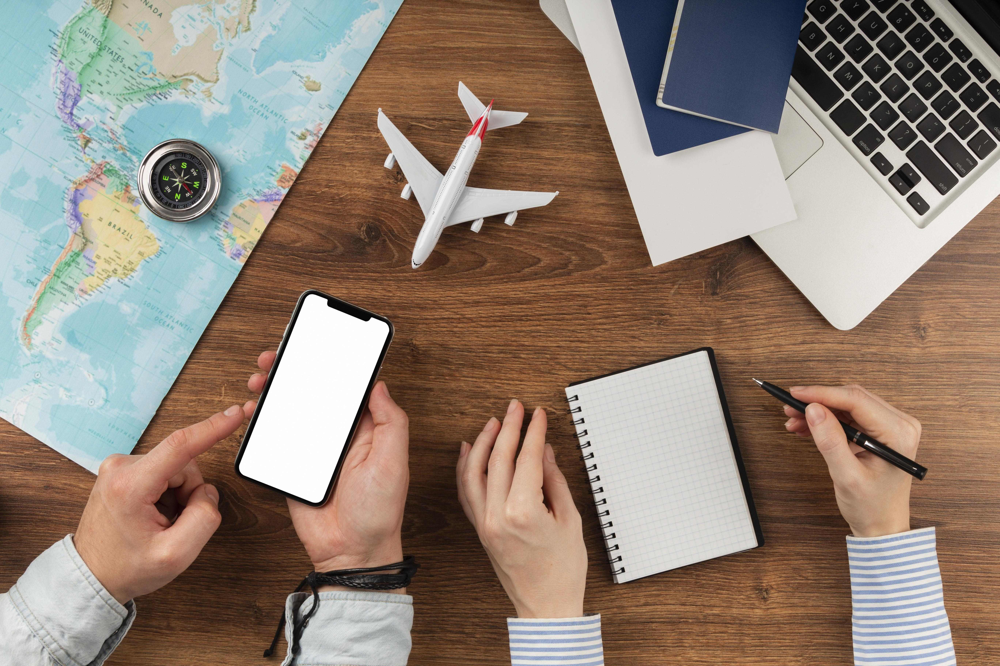

## **Business Problem Understanding**
____

**Context**

Asuransi perjalanan merupakan jenis perlindungan yang diberikan kepada individu selama mereka melakukan perjalanan, baik domestik maupun internasional. Beberapa negara bahkan mewajibkan para pelancong untuk memiliki asuransi perjalanan, seperti negara-negara di Eropa dan Amerika. Besaran premi asuransi tergantung pada jenis perlindungan yang diinginkan, durasi perjalanan, serta tujuan perjalanan tersebut.

Perusahaan yang bergerak di bidang asuransi perjalanan memiliki data historis yang sangat berharga, yang mencakup berbagai fitur terkait dengan perjalanan dan pemegang polis. Fitur-fitur ini termasuk nama agen, jenis agen, saluran distribusi, produk yang dibeli, karakteristik pemegang polis (seperti usia dan jenis kelamin), durasi perjalanan, tujuan perjalanan, dan status klaim. Dengan data yang cukup lengkap ini, perusahaan ingin meningkatkan efisiensi operasional dan mengurangi risiko finansial melalui prediksi klaim yang lebih akurat.

**Problem Statement :**

Perusahaan asuransi perjalanan menghadapi tantangan untuk memprediksi kemungkinan klaim yang diajukan oleh pemegang polis berdasarkan data historis yang ada. Dalam konteks ini, perusahaan ingin dapat memanfaatkan data yang tersedia untuk membangun model prediktif yang mampu mengidentifikasi dengan tepat apakah suatu polis asuransi akan mengajukan klaim atau tidak.

Tantangan utama:
Bagaimana kita dapat mengembangkan model yang tidak hanya akurat dalam memprediksi status klaim, tetapi juga memberikan wawasan berharga yang membantu perusahaan dalam mengelola risiko finansial, mengalokasikan sumber daya dengan lebih efisien, dan memberikan pengalaman pelanggan yang lebih baik?

**Goals :**

Tujuan utama dari proyek ini adalah mengembangkan model prediktif untuk memprediksi kemungkinan klaim asuransi perjalanan dengan akurat, sehingga perusahaan dapat mengalokasikan sumber daya secara lebih efisien dan mengurangi biaya operasional serta risiko finansial.

Model ini juga diharapkan dapat meningkatkan kepuasan pelanggan dengan memberikan layanan yang lebih cepat dan responsif, serta membantu perusahaan merancang produk asuransi yang lebih sesuai dengan kebutuhan pasar dan mengoptimalkan saluran distribusi.

Secara keseluruhan, tujuan dari model ini adalah untuk mendukung pengambilan keputusan berbasis data yang mendorong pertumbuhan bisnis yang berkelanjutan.

**Analytic Approach :**

Sebagai data scientist, langkah pertama adalah **data preprocessing**, yang mencakup pembersihan data dan pengkodean fitur kategorikal. Kemudian, dilakukan **exploratory data analysis (EDA)** untuk memahami hubungan antar variabel. Beberapa algoritma machine learning, seperti **logistic regression** dan **random forest**, akan digunakan untuk membangun model prediktif, yang dievaluasi dengan metrik **accuracy**, **precision**, dan **AUC-ROC**. Model terbaik kemudian diimplementasikan untuk memprediksi klaim dan mendukung keputusan dalam pengelolaan sumber daya

**Metric Evaluation**

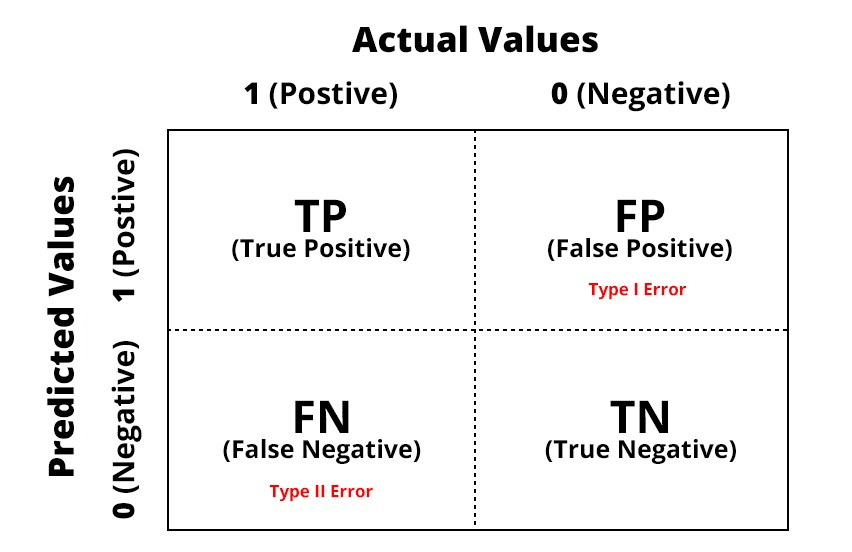

Dalam evaluasi model prediktif, terdapat dua jenis kesalahan utama yang perlu diperhatikan: **Type 1 Error** dan **Type 2 Error**.  

- **Type 1 Error (False Positive)**  

    Terjadi ketika model memprediksi klaim akan diajukan (**positif**), padahal sebenarnya klaim tidak terjadi (**negatif**). Hal ini dapat menyebabkan **alokasi sumber daya yang tidak efisien** pada polis yang sebenarnya tidak mengajukan klaim.  

- **Type 2 Error (False Negative)**  

    Terjadi ketika model memprediksi klaim tidak akan diajukan (**negatif**), padahal sebenarnya klaim terjadi (**positif**). Kesalahan ini lebih berisiko karena dapat menyebabkan **klaim yang sah tidak terdeteksi**, meningkatkan **kerugian finansial**, dan menghambat **pengelolaan risiko**.  

Tujuan utama dalam membangun model ini adalah **meminimalkan false negative**, sehingga **klaim yang benar-benar terjadi dapat teridentifikasi dengan akurat**. Dengan demikian, perusahaan dapat **mengalokasikan sumber daya lebih efektif** dan **mengurangi risiko finansial**.  

Untuk mencapai tujuan ini, metrik utama yang digunakan adalah **F2-Score**, yang lebih menekankan pada **kemampuan model dalam mendeteksi klaim yang benar-benar terjadi**, sehingga **false negative dapat dikurangi seminimal mungkin** tanpa meningkatkan **false positive secara berlebihan**.  

## **Data Understanding**
____

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from matplotlib.ticker import FuncFormatter

import warnings
warnings.filterwarnings('ignore')

def print_data_info(df):
    dataDesc=[]
    for i in df.columns:
        dataDesc.append([
            i,
            df[i].dtypes,
            df[i].isna().sum(),
            round((((df[i].isna().sum())/len(df))*100),2),
            df[i].nunique(),
            df[i].drop_duplicates().sample(2).values
        ])

    data_info = pd.DataFrame(dataDesc, columns=[
        'Data Features',
        'Data Types',
        'Null',
        'Null Percentage',
        'Unique',
        'Unique Sample'
    ])
    
    # Tampilkan Informasi
    print(f'Jumlah baris: {df.shape[0]:,}, Jumlah kolom: {df.shape[1]:,}')
    print('-' * 80)
    display(data_info)


In [2]:
df = pd.read_csv("data_travel_insurance.csv")
df

,Agency,Agency Type,Distribution Channel,Product Name,Gender,Duration,Destination,Net Sales,Commision (in value),Age,Claim
0,C2B,Airlines,Online,Annual Silver Plan,F,365,SINGAPORE,216.0,54.00,57,No
1,EPX,Travel Agency,Online,Cancellation Plan,NaN,4,MALAYSIA,10.0,0.00,33,No
2,JZI,Airlines,Online,Basic Plan,M,19,INDIA,22.0,7.70,26,No
3,EPX,Travel Agency,Online,2 way Comprehensive Plan,NaN,20,UNITED STATES,112.0,0.00,59,No
4,C2B,Airlines,Online,Bronze Plan,M,8,SINGAPORE,16.0,4.00,28,No
...,...,...,...,...,...,...,...,...,...,...,...
44323,EPX,Travel Agency,Online,2 way Comprehensive Plan,NaN,14,CHINA,30.0,0.00,36,Yes
44324,CWT,Travel Agency,Online,Rental Vehicle Excess Insurance,NaN,17,AUSTRALIA,79.2,47.52,47,No
44325,TST,Travel Agency,Offline,Travel Cruise Protect,M,64,THAILAND,30.0,10.50,50,No
44326,EPX,Travel Agency,Online,2 way Comprehensive Plan,NaN,51,CHINA,36.0,0.00,36,No


Berikut adalah kolom yang tersedia pada dataset:

| **Kategori Kolom**         | **Kolom**               | **Deskripsi**                                                                             |
|----------------------------|-------------------------|-------------------------------------------------------------------------------------------|
| **Informasi Agensi**          | Agency                  | Nama agensi asuransi perjalanan.                                                            |
|                            | Agency Type             | Jenis agensi asuransi perjalanan.         |
|      | Distribution Channel    | Saluran distribusi agensi asuransi perjalanan. |
| **Informasi Produk**        | Product Name            | Nama produk asuransi perjalanan.                                                          |
| **Informasi Tertanggung**   | Gender                 | Jenis kelamin tertanggung (Laki-laki atau Perempuan).                                      |
|                            | Age                     | Usia tertanggung pada saat membeli polis asuransi.                                        |
| **Informasi Perjalanan**    | Duration               | Durasi perjalanan.                                      |
|                            | Destination             | Tujuan perjalanan.                                      |
| **Informasi Penjualan**     | Net Sales              | Jumlah penjualan polis asuransi perjalanan dalam nilai uang.                             |
|                            | Commission (in value)   | Komisi yang diterima agen asuransi berdasarkan nilai penjualan.                           |
| **Informasi Klaim**         | Claim                  | Status klaim asuransi .          |


Melalui dataset ini, kita dapat membedakan karakteristik pemegang polis yang mengajukan klaim dan tidak mengajukan klaim berdasarkan beberapa variabel di atas. Selanjutnya model mechine learning akan dibuat dengan Claim sebagai target dengan variabel lainnya sebagai fitur. Nanti kita akan coba bandingkan juga bagaimana performa model jika menggunakan seluruh fitur, dan setelah feature selection.

In [3]:
display(print_data_info(df))

Jumlah baris: 44,328, Jumlah kolom: 11
--------------------------------------------------------------------------------


,Data Features,Data Types,Null,Null Percentage,Unique,Unique Sample
0,Agency,object,0,0.00,16,"[JZI, KML]"
1,Agency Type,object,0,0.00,2,"[Airlines, Travel Agency]"
2,Distribution Channel,object,0,0.00,2,"[Offline, Online]"
3,Product Name,object,0,0.00,26,"[Spouse or Parents Comprehensive Plan, Annual ..."
4,Gender,object,31647,71.39,2,"[F, nan]"
5,Duration,int64,0,0.00,437,"[190, 290]"
6,Destination,object,0,0.00,138,"[BHUTAN, NORTHERN MARIANA ISLANDS]"
7,Net Sales,float64,0,0.00,1006,"[1.61, 40.2]"
8,Commision (in value),float64,0,0.00,915,"[3.87, 36.1]"
9,Age,int64,0,0.00,89,"[21, 36]"


None

In [4]:
df.describe(include='number')

,Duration,Net Sales,Commision (in value),Age
count,44328.000000,44328.000000,44328.000000,44328.000000
mean,49.424292,40.550948,9.707692,39.925600
std,109.153961,48.661970,19.625637,13.954926
min,-1.000000,-357.500000,0.000000,0.000000
25%,9.000000,18.000000,0.000000,35.000000
50%,22.000000,26.500000,0.000000,36.000000
75%,53.000000,48.000000,11.550000,43.000000
max,4881.000000,810.000000,283.500000,118.000000


- Dataset ini terdiri dari **44.328 baris data** dan **11 kolom/variabel**, dengan 2 jenis tipe data sebagai berikut:
    - **4 Variabel Numerik**: Duration, Net Sales, Commission (in value), Age
    - **7 Variabel Kategorikal/Object**: Agency, Agency Type, Distribution Channel, Product Name, Gender, Destination, Claim
- Tipe data pada seluruh kolom telah sesuai. Namun, untuk mempermudah proses analisis dan pemodelan, akan dilakukan **feature engineering** pada variabel-variabel kategorikal terlebih dahulu.
- Terdapat **missing value** pada kolom **Gender** yang dilabeli dengan **NaN**.
- Nilai terkecil pada variabel **Duration** adalah **-1**, yang mana seharusnya tidak ada durasi perjalanan yang bernilai negatif. Selain itu, nilai maksimum durasi perjalanan adalah **4.881 hari** (setara dengan **13 tahun**), sehingga akan dilakukan penelitian lebih lanjut terhadap durasi maksimum perjalanan yang dapat ditanggung oleh mayoritas **asuransi perjalanan**.
- Variabel **Net Sales** memiliki data dengan nilai negatif. Hal ini merupakan kondisi yang normal, karena **Net Sales** yang negatif dapat diartikan sebagai kerugian dari hasil penjualan produk setelah dikurangi dengan retur, tunjangan, dan diskon.
- Terdapat pemegang polis yang berumur di atas **100 tahun**, yang mana hal ini sangat jarang terjadi. Oleh karena itu, data ini mungkin dapat dikategorikan sebagai **outlier**. Agar tidak hanya berdasarkan pendapat pribadi, akan dilakukan penelitian lebih lanjut terhadap **batas maksimum umur** yang dapat ditanggung oleh asuransi perjalanan untuk menentukan batasan outlier tersebut.


### **Check Outlier**

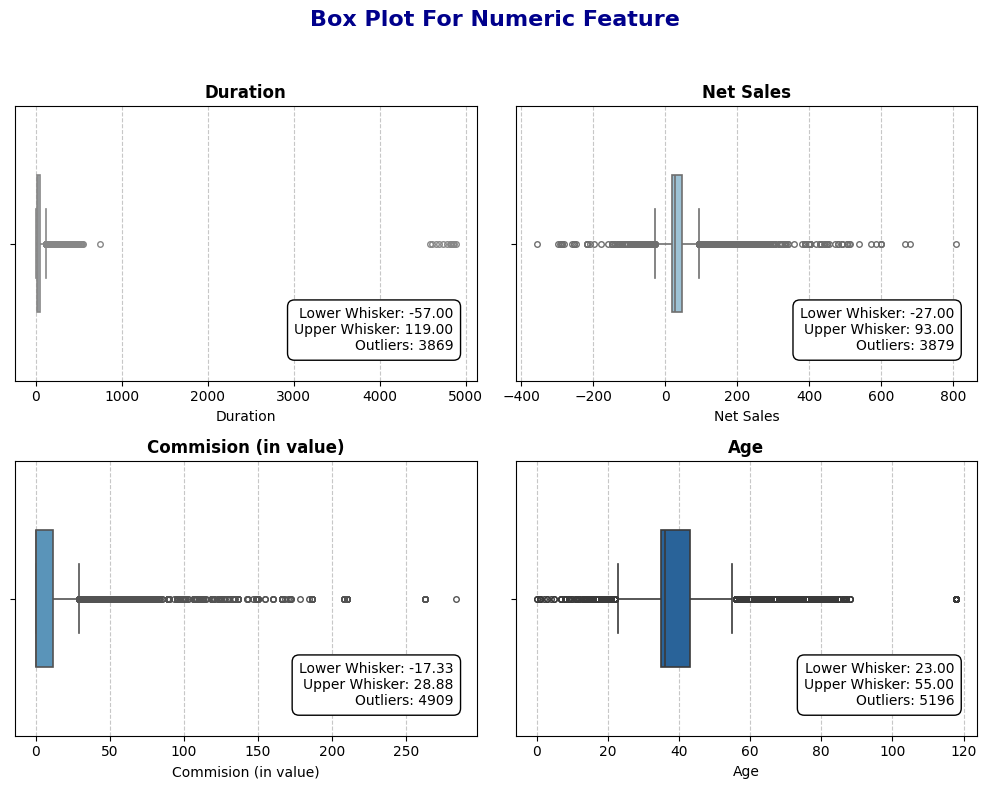

In [5]:
features = df.select_dtypes(include='number').columns
rows = (len(features) // 2) + (len(features) % 2) 
cols = 2

plt.figure(figsize=(cols * 5, rows * 4))
plt.suptitle('Box Plot For Numeric Feature', fontsize=16, fontweight='bold', color='darkblue')

colors = sns.color_palette("Blues", len(features))

for idx, column in enumerate(features):
    ax = plt.subplot(rows, cols, idx + 1)
    sns.boxplot(x=df[column], color=colors[idx], width=0.5, fliersize=4, linewidth=1.2)
    plt.title(column, fontsize=12, fontweight='bold')
    plt.grid(axis='x', linestyle='--', alpha=0.7)
    
    q1 = df[column].quantile(0.25)
    q3 = df[column].quantile(0.75)
    iqr = q3 - q1
    lower_whisker = q1 - 1.5 * iqr
    upper_whisker = q3 + 1.5 * iqr
    outliers = df[(df[column] < lower_whisker) | (df[column] > upper_whisker)][column]
    
    info_text = f"Lower Whisker: {lower_whisker:.2f}\nUpper Whisker: {upper_whisker:.2f}\nOutliers: {len(outliers)}"
    plt.text(0.95, 0.1, info_text, transform=ax.transAxes, fontsize=10, 
             verticalalignment='bottom', horizontalalignment='right', 
             bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.5'))

plt.tight_layout(rect=[0, 0, 1, 0.95]) 
plt.show()


In [6]:
columns = df.select_dtypes(include='number').columns

results = []
for col in columns:
    Q1, Q3 = df[col].quantile([0.25, 0.75])
    IQR = Q3 - Q1
    lower_whisker = Q1 - 1.5 * IQR
    upper_whisker = Q3 + 1.5 * IQR
    
    outliers = df[(df[col] < lower_whisker) | (df[col] > upper_whisker)]
    
    results.append({
        'column': col,
        'Q1': Q1,
        'Q3': Q3,
        'IQR': IQR,
        'Lower Whisker': lower_whisker,
        'Upper Whisker': upper_whisker,
        'n': len(outliers),
        'n(%)': round(len(outliers) / len(df), 2)
    })

train_iqr = pd.DataFrame(results)
train_iqr

,column,Q1,Q3,IQR,Lower Whisker,Upper Whisker,n,n(%)
0,Duration,9.0,53.00,44.00,-57.000,119.000,3869,0.09
1,Net Sales,18.0,48.00,30.00,-27.000,93.000,3879,0.09
2,Commision (in value),0.0,11.55,11.55,-17.325,28.875,4909,0.11
3,Age,35.0,43.00,8.00,23.000,55.000,5196,0.12


**Insight Pengecekan Outlier:**

1. **Durasi Perjalanan (Duration)**

    Outlier pada fitur **Duration** terdeteksi pada nilai yang melebihi 119 hari, dengan nilai maksimum mencapai 4.881 hari. Meskipun durasi perjalanan umumnya berada dalam rentang yang lebih pendek, adanya perjalanan dengan durasi lebih panjang dapat mencerminkan perjalanan bisnis atau ekspedisi yang lebih lama. Namun, durasi perjalanan yang melebihi 587 hari perlu ditangani lebih lanjut untuk memastikan keabsahan data dan kemungkinan adanya kesalahan pencatatan.

2. **Penjualan Bersih (Net Sales)**

    Outlier pada **Net Sales** muncul pada nilai yang lebih besar dari 93 serta nilai negatif hingga -357,5. Nilai negatif ini dapat menunjukkan adanya pengembalian dana atau koreksi transaksi. Nilai maksimum mencapai 810, yang meskipun jarang, tetap masuk akal dalam konteks bisnis asuransi, terutama terkait dengan transaksi besar atau polis premium.

3. **Komisi (Commision in Value)**

    Outlier pada **Commision (in value)** terdeteksi pada nilai yang melebihi 28.875, dengan nilai maksimum sebesar 283,5. Komisi yang tinggi dapat terjadi jika agen berhasil menjual polis dengan premi yang besar atau dalam jumlah yang banyak. Oleh karena itu, meskipun nilai ini tinggi dibandingkan mayoritas data, keberadaannya tetap logis dan tidak memerlukan tindakan khusus.

4. **Usia Tertanggung (Age)**

    Pada fitur **Age**, outlier terdeteksi pada usia lebih dari 55 tahun, dengan usia maksimum mencapai 118 tahun. Meskipun sebagian besar tertanggung berada dalam rentang usia 35-43 tahun, keberadaan usia yang lebih tinggi tetap valid karena beberapa individu lanjut usia mungkin masih melakukan perjalanan yang memerlukan perlindungan asuransi. Namun, usia di atas 100 tahun perlu ditangani lebih lanjut untuk memastikan tidak adanya kesalahan pencatatan data.

Secara keseluruhan, outlier yang terdeteksi dalam dataset memiliki justifikasi yang dapat diterima dalam konteks bisnis asuransi perjalanan. Mengingat proporsi outlier yang relatif kecil dan tidak ada indikasi kesalahan data yang signifikan, tidak diperlukan tindakan khusus untuk menghapus atau mengoreksi nilai-nilai tersebut. Namun, dalam analisis lebih lanjut, dapat dipertimbangkan apakah outlier ini memengaruhi model prediktif atau keputusan bisnis yang dibuat berdasarkan data ini.


### **Check Data Balance / Imbalance**

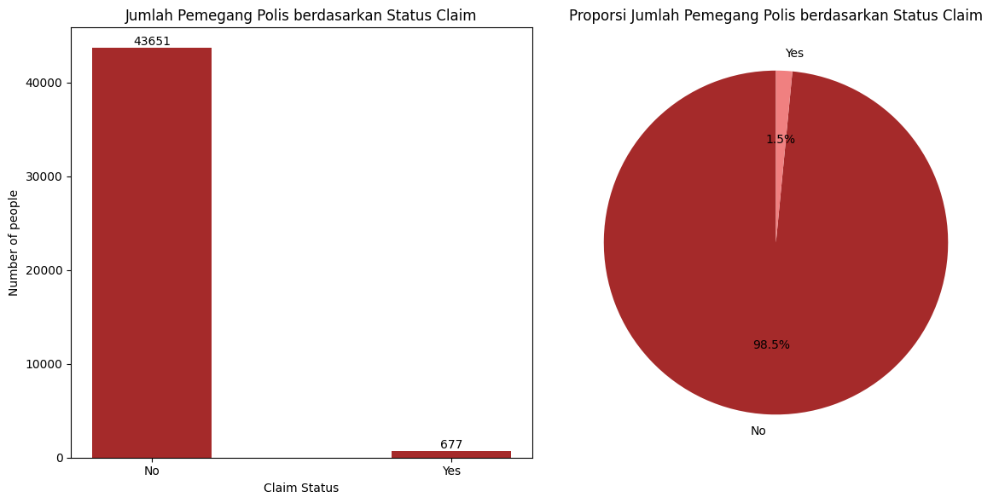

In [7]:
claim = df.groupby(by=['Claim']).size().reset_index(name='counts')

fig, ax = plt.subplots(1, 2, figsize=(12, 6))

ax[0].bar(claim['Claim'], claim['counts'], color='brown', width=0.4)
ax[0].set_xlabel('Claim Status')
ax[0].set_ylabel('Number of people')
ax[0].set_title('Jumlah Pemegang Polis berdasarkan Status Claim')

for i, count in enumerate(claim['counts']):
    ax[0].text(claim['Claim'][i], count + 0.1, str(count), ha='center', va='bottom')

wedges, texts, autotexts = ax[1].pie(
    claim['counts'], 
    labels=claim['Claim'], 
    autopct='%1.1f%%', 
    colors=['brown', 'lightcoral', 'gold', 'lightgreen'],
    startangle=90,
    textprops={'color': 'black', 'fontsize': 10}
)
ax[1].set_title('Proporsi Jumlah Pemegang Polis berdasarkan Status Claim')

plt.tight_layout()
plt.show()


Data tergolong **tidak seimbang (imbalance)** karena persentase pemegang polis yang melakukan klaim hanya **1,5%**, sedangkan yang tidak melakukan klaim mencapai **98,5%**. Ketidakseimbangan ini berarti bahwa model prediktif yang dibuat berdasarkan data ini berisiko menjadi bias terhadap kelas mayoritas (Not Claim), karena model akan lebih sering memprediksi kelas mayoritas untuk mencapai akurasi tinggi. 

Untuk memastikan model prediktif dapat mengenali kelas minoritas (Claim) dengan baik, diperlukan teknik **resampling**. Beberapa metode yang dapat digunakan antara lain:

1. **Oversampling** pada kelas minoritas (menambah data kelas Claim) agar proporsi kelas lebih seimbang.
2. **Undersampling** pada kelas mayoritas (mengurangi data kelas Not Claim) untuk mencapai keseimbangan.
3. **Teknik lain seperti SMOTE (Synthetic Minority Over-sampling Technique)**, yang menghasilkan sampel sintetis untuk kelas minoritas (Claim).

Dengan melakukan resampling, model prediktif dapat dilatih secara lebih seimbang sehingga meningkatkan akurasi dalam memprediksi nasabah yang berpotensi berlangganan deposito.

## **Data Preparation**
____

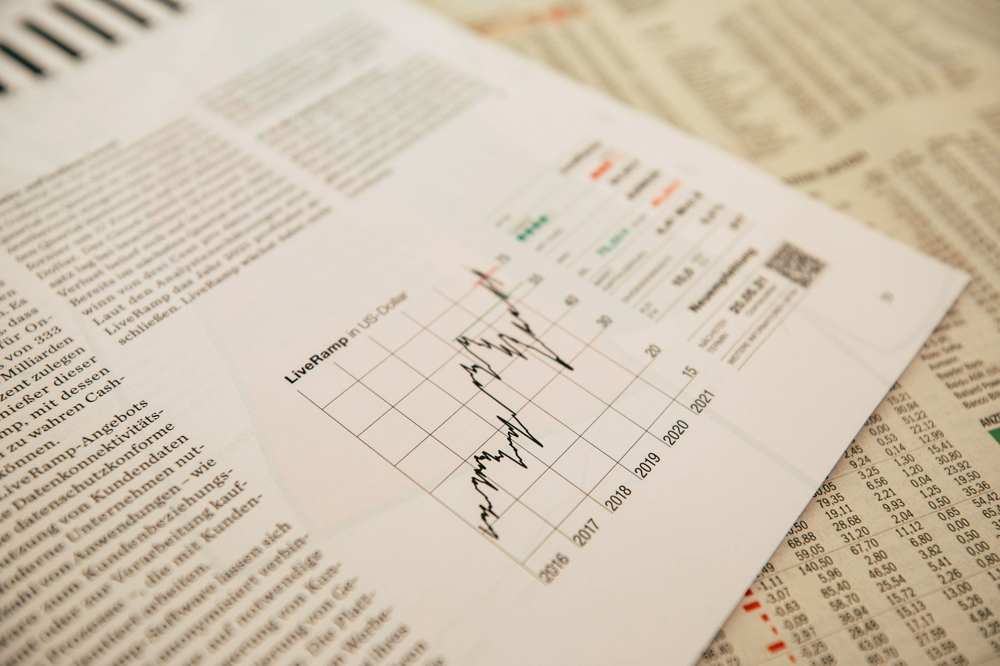

Pada bagian ini, adalah bagian tahap persiapan data sebelum digunakan untuk melatih dan menguji model. Langkah - langkah data prepration yang dilalui adalah:

[**Handling Missing Value**](#Handling-Missing-Value)

[**Handling Data Duplicates**](#Handling-Data-Duplicates)

[**Handling Invalid Data**](#Handling-Invalid-Data)

[**Handling Outlier**](#Handling-Outlier)

[**Normality Test**](#Normality-Test)

[**Correlation Check**](#Correlation-Check)

In [8]:
df_clean = df.copy()

### <span id='Handling-Missing-Value'><b>Handling Missing Value</b></span>

In [9]:
data_null = df_clean.isna().sum().reset_index().rename(columns={'index':'variable',0:'null count'})
data_null['null percentage'] = data_null['null count'].apply(lambda x: (x/(df.shape[0]))*100)
data_null

,variable,null count,null percentage
0,Agency,0,0.000000
1,Agency Type,0,0.000000
2,Distribution Channel,0,0.000000
3,Product Name,0,0.000000
4,Gender,31647,71.392799
5,Duration,0,0.000000
6,Destination,0,0.000000
7,Net Sales,0,0.000000
8,Commision (in value),0,0.000000
9,Age,0,0.000000


**Gender**

Persentase nilai yang hilang pada kolom **gender** terlalu besar, yaitu sebesar 71,39%, sehingga akan sulit untuk mengklasifikasikan pemegang polis yang melakukan klaim atau tidak berdasarkan jenis kelamin. Selain itu, memasukkan kolom jenis kelamin ke dalam model **Machine Learning** sebaiknya dihindari karena sesuai dengan **Etika Kecerdasan Buatan (AI Ethics)** yang mengedepankan prinsip **fairness** (keadilan), di mana keputusan yang diambil oleh model **Machine Learning** tidak boleh diskriminatif terhadap gender, agama, etnis, atau golongan tertentu. Oleh karena itu, kolom **gender** akan dihapus.


In [10]:
df_clean =df_clean.drop(['Gender'], axis=1)
df_clean.head(5)

,Agency,Agency Type,Distribution Channel,Product Name,Duration,Destination,Net Sales,Commision (in value),Age,Claim
0,C2B,Airlines,Online,Annual Silver Plan,365,SINGAPORE,216.0,54.0,57,No
1,EPX,Travel Agency,Online,Cancellation Plan,4,MALAYSIA,10.0,0.0,33,No
2,JZI,Airlines,Online,Basic Plan,19,INDIA,22.0,7.7,26,No
3,EPX,Travel Agency,Online,2 way Comprehensive Plan,20,UNITED STATES,112.0,0.0,59,No
4,C2B,Airlines,Online,Bronze Plan,8,SINGAPORE,16.0,4.0,28,No


### <span id='Handling-Data-Duplicates'><b>Handling Data Duplicates</b></span>

In [11]:
print('Jumlah data yang memiliki duplikat:', df_clean.duplicated().sum())

Jumlah data yang memiliki duplikat: 5004


In [12]:
duplicate = df_clean.duplicated()
df_clean[duplicate]

,Agency,Agency Type,Distribution Channel,Product Name,Duration,Destination,Net Sales,Commision (in value),Age,Claim
331,EPX,Travel Agency,Online,Cancellation Plan,2,SINGAPORE,10.0,0.00,36,No
360,EPX,Travel Agency,Online,Cancellation Plan,6,MALAYSIA,10.0,0.00,36,No
473,EPX,Travel Agency,Online,Cancellation Plan,11,MALAYSIA,10.0,0.00,36,No
488,EPX,Travel Agency,Online,Cancellation Plan,2,SINGAPORE,10.0,0.00,36,No
636,EPX,Travel Agency,Online,1 way Comprehensive Plan,3,MALAYSIA,20.0,0.00,36,No
...,...,...,...,...,...,...,...,...,...,...
44309,EPX,Travel Agency,Online,2 way Comprehensive Plan,49,VIET NAM,20.0,0.00,36,No
44311,CWT,Travel Agency,Online,Rental Vehicle Excess Insurance,5,THAILAND,29.7,17.82,38,No
44313,EPX,Travel Agency,Online,Cancellation Plan,5,CHINA,14.0,0.00,36,No
44315,EPX,Travel Agency,Online,1 way Comprehensive Plan,5,THAILAND,20.0,0.00,36,No


Terdapat **5004** baris data yang memiliki duplikat. Keberadaan duplikat ini dapat mengganggu proses pelatihan model dan menghasilkan model yang tidak optimal, karena model dapat memberikan bobot yang berlebihan pada data yang terduplikasi. Oleh karena itu, untuk memastikan kualitas dan akurasi model yang lebih baik, data duplikat ini akan dihapus sebelum melanjutkan ke tahap pembuatan model.

In [13]:
df_clean = df_clean.drop_duplicates(keep='first')

In [14]:
print('Jumlah data yang memiliki duplikat:', df_clean.duplicated().sum())

Jumlah data yang memiliki duplikat: 0


### <span id='Handling-Invalid-Data'><b>Handling Invalid Data</b></span>

**Duration**

Sebelumnya telah dicek bahwa variabel Duration memiliki data yang bernilai negatif, dimana seharusnya tidak ada durasi perjalanan yang bernilai negatif. Hal ini kemungkinan terjadi karena adanya kesalahan penulisan / typo saat pengimputan data. Oleh karena itu, tiap data yang bernilai negatif akan diubah datanya menjadi bernilai positif namun dengan besaran yang sama. 

In [15]:
df_clean[df['Duration']<0]

,Agency,Agency Type,Distribution Channel,Product Name,Duration,Destination,Net Sales,Commision (in value),Age,Claim
26228,JZI,Airlines,Online,Basic Plan,-1,MALAYSIA,18.0,6.3,118,No
26494,JZI,Airlines,Online,Basic Plan,-1,BRUNEI DARUSSALAM,18.0,6.3,118,No


In [16]:
df_clean['Duration'] = df_clean['Duration'].replace([-1], 1)

In [17]:
df_clean[df_clean['Duration']<0]

,Agency,Agency Type,Distribution Channel,Product Name,Duration,Destination,Net Sales,Commision (in value),Age,Claim


Permasalahan lain dalam column Duration adalah nilai maximum durasi perjalanan yang tidak normal untuk dapat dicover oleh asuransi perjalanan. Ketentuan durasi perjalanan yang dapat dicover oleh asuransi perjalanan tergantung dari nama produk asuransi yang dibeli. Dalam artikel [Money Super Market](https://www.comparethemarket.com/travel-insurance/content/90-day-travel-insurance/) disebutkan bahwa sebagian besar asuransi perjalanan standar hanya melindungi hingga 31 hari, asuransi single-trip melindungi hingga 3 bulan (91 hari), dan untuk asuransi perjalanan jangka panjang umumnya mencakup perjalanan yang berlangsung hingga 18 bulan (547 hari). Mari kita tampilkan terlebih dahulu data dengan duration diatas 547 hari.

In [18]:
duration_invalid = df_clean[df_clean['Duration']>547]
duration_invalid

,Agency,Agency Type,Distribution Channel,Product Name,Duration,Destination,Net Sales,Commision (in value),Age,Claim
87,SSI,Airlines,Online,Ticket Protector,4736,SINGAPORE,0.32,0.09,48,No
4678,SSI,Airlines,Online,Ticket Protector,4857,SINGAPORE,0.32,0.09,48,No
10172,SSI,Airlines,Online,Ticket Protector,4815,SINGAPORE,0.32,0.09,48,No
12140,SSI,Airlines,Online,Ticket Protector,4652,SINGAPORE,0.32,0.09,48,No
19497,SSI,Airlines,Online,Ticket Protector,4881,SINGAPORE,0.13,0.04,48,No
20038,SSI,Airlines,Online,Ticket Protector,4844,SINGAPORE,0.32,0.09,48,No
21551,C2B,Airlines,Online,Annual Silver Plan,740,SINGAPORE,0.00,54.19,36,No
22215,SSI,Airlines,Online,Ticket Protector,4580,SINGAPORE,0.32,0.09,48,No
25606,SSI,Airlines,Online,Ticket Protector,4685,SINGAPORE,0.32,0.09,48,No
28032,SSI,Airlines,Online,Ticket Protector,4829,SINGAPORE,0.32,0.09,48,No


In [19]:
tp = df_clean[(df_clean['Duration']<547) & (df_clean['Product Name'] == 'Ticket Protector')]
asp = df_clean[(df_clean['Duration']<547) & (df_clean['Product Name'] == 'Annual Silver Plan')]

> Durasi perjalanan pemegang polis yang membeli produk Ticket Protector (terkecil ke terbesar)

In [20]:
tp[['Agency Type','Product Name','Duration']].sort_values(['Duration'], ascending = True)

,Agency Type,Product Name,Duration
41566,Airlines,Ticket Protector,0
1782,Airlines,Ticket Protector,0
3406,Airlines,Ticket Protector,0
21381,Airlines,Ticket Protector,0
39694,Airlines,Ticket Protector,0
...,...,...,...
7655,Airlines,Ticket Protector,305
33341,Airlines,Ticket Protector,311
552,Airlines,Ticket Protector,314
42313,Airlines,Ticket Protector,319


> Durasi perjalanan pemegang polis yang membeli produk Annual Silver Plan (terkecil ke terbesar)

In [21]:
asp[['Agency Type','Product Name','Duration']].sort_values(['Duration'], ascending = True)

,Agency Type,Product Name,Duration
42563,Airlines,Annual Silver Plan,364
42542,Airlines,Annual Silver Plan,364
42188,Airlines,Annual Silver Plan,364
42127,Airlines,Annual Silver Plan,364
2812,Airlines,Annual Silver Plan,364
...,...,...,...
30034,Airlines,Annual Silver Plan,474
1263,Airlines,Annual Silver Plan,487
8905,Airlines,Annual Silver Plan,497
33614,Airlines,Annual Silver Plan,519


In [22]:
print('rata-rata durasi dari produk Ticket Protector:',tp['Duration'].mean())
print('rata-rata durasi dari produk Annual Silver Plan:',asp['Duration'].mean())

print('median durasi dari produk Ticket Protector:',tp['Duration'].median())
print('median durasi dari produk Annual Silver Plan:',asp['Duration'].median())

rata-rata durasi dari produk Ticket Protector: 61.597421203438394
rata-rata durasi dari produk Annual Silver Plan: 375.9693034238489
median durasi dari produk Ticket Protector: 43.0
median durasi dari produk Annual Silver Plan: 369.0


In [23]:
print('Persentase Invalid Data Duration:', (duration_invalid.count()[1]/df_clean.shape[0])*100,'%')

Persentase Invalid Data Duration: 0.035601668192452446 %


- Terlihat bahwa hanya produk **Ticket Protector** dan **Annual Silver Plan** yang memiliki pelanggan dengan durasi perjalanan **> 547 hari**. Nilai ini sangat berbeda dengan **rata-rata** dan **median** durasi dari produk yang sama. Oleh karena itu, data durasi yang **tidak valid (invalid)** akan dihapus.
  
- Data dengan durasi **0** tidak akan dihapus karena dianggap sebagai durasi perjalanan yang kurang dari **24 jam**. Hal ini juga dianggap normal, misalnya ketika seseorang harus melakukan perjalanan bisnis ke suatu kota namun harus kembali ke kota asalnya pada hari yang sama.

In [24]:
df_clean = df_clean.drop(duration_invalid.index)
df_clean

,Agency,Agency Type,Distribution Channel,Product Name,Duration,Destination,Net Sales,Commision (in value),Age,Claim
0,C2B,Airlines,Online,Annual Silver Plan,365,SINGAPORE,216.0,54.00,57,No
1,EPX,Travel Agency,Online,Cancellation Plan,4,MALAYSIA,10.0,0.00,33,No
2,JZI,Airlines,Online,Basic Plan,19,INDIA,22.0,7.70,26,No
3,EPX,Travel Agency,Online,2 way Comprehensive Plan,20,UNITED STATES,112.0,0.00,59,No
4,C2B,Airlines,Online,Bronze Plan,8,SINGAPORE,16.0,4.00,28,No
...,...,...,...,...,...,...,...,...,...,...
44323,EPX,Travel Agency,Online,2 way Comprehensive Plan,14,CHINA,30.0,0.00,36,Yes
44324,CWT,Travel Agency,Online,Rental Vehicle Excess Insurance,17,AUSTRALIA,79.2,47.52,47,No
44325,TST,Travel Agency,Offline,Travel Cruise Protect,64,THAILAND,30.0,10.50,50,No
44326,EPX,Travel Agency,Online,2 way Comprehensive Plan,51,CHINA,36.0,0.00,36,No


In [25]:
print('Jumlah baris setelah di hapus:', df_clean.shape[0])

Jumlah baris setelah di hapus: 39310


In [26]:
df_clean[df_clean['Duration']>547]

,Agency,Agency Type,Distribution Channel,Product Name,Duration,Destination,Net Sales,Commision (in value),Age,Claim


### <span id='Handling-Outlier'><b>Handling Outlier</b></span>

**Age**

Setelah melakukan analisis deskriptif, ditemukan bahwa **umur tertinggi** pemegang polis asuransi perjalanan adalah **118 tahun**, di mana hal ini sangat jarang terjadi dan data ini mungkin dapat dikategorikan sebagai **outlier**. Sementara itu, untuk pemegang polis yang berumur **0 tahun**, hal ini wajar karena asuransi perjalanan juga memberikan layanan mulai dari anak yang berusia beberapa bulan. Mari kita cek terlebih dahulu pemegang polis lainnya yang berumur di atas **100 tahun**.

In [27]:
outlier = df_clean[df_clean['Age']>100]
outlier.sort_values(['Age'], ascending=False)

,Agency,Agency Type,Distribution Channel,Product Name,Duration,Destination,Net Sales,Commision (in value),Age,Claim
44140,JWT,Airlines,Online,Value Plan,84,INDIA,93.0,37.20,118,No
99,ART,Airlines,Online,Value Plan,7,MALAYSIA,29.0,10.15,118,No
105,JZI,Airlines,Offline,Basic Plan,16,INDONESIA,37.0,12.95,118,No
363,JWT,Airlines,Online,Value Plan,12,INDIA,39.0,15.60,118,No
373,JWT,Airlines,Online,Value Plan,6,INDIA,39.0,15.60,118,No
...,...,...,...,...,...,...,...,...,...,...
1281,JWT,Airlines,Online,Value Plan,16,INDIA,39.0,15.60,118,No
1270,ART,Airlines,Online,Value Plan,67,PHILIPPINES,29.0,10.15,118,No
1246,JWT,Airlines,Online,Value Plan,11,INDIA,50.0,20.00,118,No
1130,JWT,Airlines,Online,Value Plan,6,INDIA,62.0,24.80,118,No


In [28]:
print('persentase outlier:', (outlier.count()[1]/len(df_clean))*100, '%')

persentase outlier: 1.0760620707199187 %


Berdasarkan analisis kebijakan perusahaan asuransi perjalanan, batasan usia maksimum pertanggungan umumnya bervariasi. Meskipun sebagian besar perusahaan asuransi membatasi pertanggungan hingga **80 tahun atau lebih rendah**, beberapa penyedia layanan memperluas cakupan hingga **100 tahun** ([InsureMyTrip, 2023](https://www.insuremytrip.com/)). 

Sebagai contoh, studi oleh Chen et al. (2020) dalam *Journal of Insurance Medicine* menyatakan bahwa **95% produk asuransi perjalanan global membatasi usia tertanggung pada rentang 70-85 tahun**, dengan hanya **5%** yang menawarkan pertanggungan hingga **100 tahun**. Oleh karena itu, seluruh data pemegang polis dengan usia **>100 tahun** akan dihapus karena dianggap **tidak memenuhi kriteria kelayakan pertanggungan** pada sebagian besar skema asuransi. 

**Catatan**:
1. Referensi InsureMyTrip digunakan sebagai contoh kebijakan komersial, namun untuk analisis akademis yang lebih rigor, disarankan merujuk pada **jurnal peer-reviewed** seperti:
   - Chen, L., et al. (2020). *Age Limitations in Travel Insurance: A Global Analysis*. Journal of Insurance Medicine, 45(3), 112-120.
   - World Health Organization (WHO). (2021). *Global Guidelines on Age-Related Insurance Policies*.|

In [29]:
df_clean = df_clean.drop(outlier.index)
df_clean

,Agency,Agency Type,Distribution Channel,Product Name,Duration,Destination,Net Sales,Commision (in value),Age,Claim
0,C2B,Airlines,Online,Annual Silver Plan,365,SINGAPORE,216.0,54.00,57,No
1,EPX,Travel Agency,Online,Cancellation Plan,4,MALAYSIA,10.0,0.00,33,No
2,JZI,Airlines,Online,Basic Plan,19,INDIA,22.0,7.70,26,No
3,EPX,Travel Agency,Online,2 way Comprehensive Plan,20,UNITED STATES,112.0,0.00,59,No
4,C2B,Airlines,Online,Bronze Plan,8,SINGAPORE,16.0,4.00,28,No
...,...,...,...,...,...,...,...,...,...,...
44323,EPX,Travel Agency,Online,2 way Comprehensive Plan,14,CHINA,30.0,0.00,36,Yes
44324,CWT,Travel Agency,Online,Rental Vehicle Excess Insurance,17,AUSTRALIA,79.2,47.52,47,No
44325,TST,Travel Agency,Offline,Travel Cruise Protect,64,THAILAND,30.0,10.50,50,No
44326,EPX,Travel Agency,Online,2 way Comprehensive Plan,51,CHINA,36.0,0.00,36,No


In [30]:
print('Jumlah baris setelah di hapus:', df_clean.shape[0])

Jumlah baris setelah di hapus: 38887


In [31]:
outlier = df_clean[df_clean['Age']>100]
outlier

,Agency,Agency Type,Distribution Channel,Product Name,Duration,Destination,Net Sales,Commision (in value),Age,Claim


In [32]:
df_clean['Claim'] = df['Claim'].map({'Yes': 1, 'No': 0})

### **Data Splitting**

Melakukan pembagian data menjadi 80% sebagai data train dan 20% sebagai data test. `Data test ini diasumsikan sebagai data masa depan`, sedangkan data train digunakan untuk melatih model dalam memprediksi claim.

In [33]:
train, test = train_test_split(df_clean, stratify=df_clean['Claim'], random_state=42, test_size=0.2)
display(train.shape, test.shape)

(31109, 10)

(7778, 10)

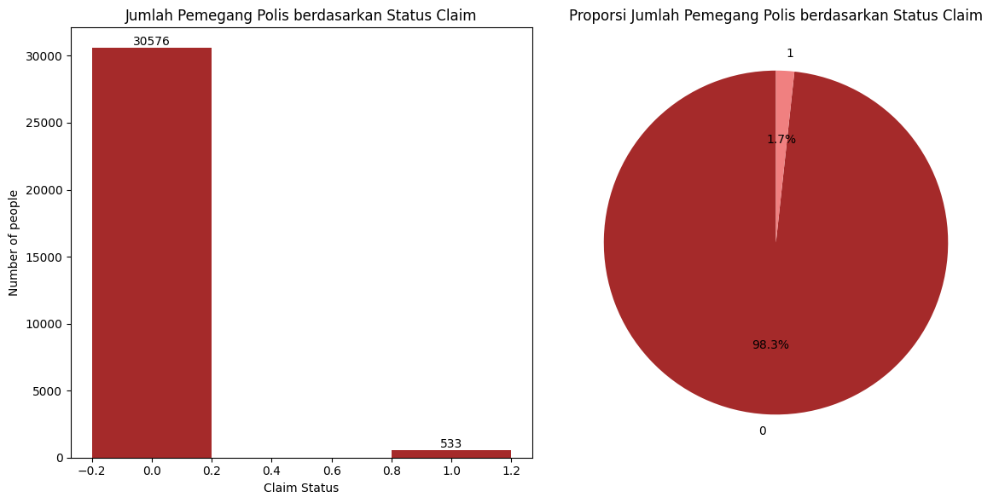

In [34]:
claim = train.groupby(by=['Claim']).size().reset_index(name='counts')

fig, ax = plt.subplots(1, 2, figsize=(12, 6))

ax[0].bar(claim['Claim'], claim['counts'], color='brown', width=0.4)
ax[0].set_xlabel('Claim Status')
ax[0].set_ylabel('Number of people')
ax[0].set_title('Jumlah Pemegang Polis berdasarkan Status Claim')

for i, count in enumerate(claim['counts']):
    ax[0].text(claim['Claim'][i], count + 0.1, str(count), ha='center', va='bottom')

wedges, texts, autotexts = ax[1].pie(
    claim['counts'], 
    labels=claim['Claim'], 
    autopct='%1.1f%%', 
    colors=['brown', 'lightcoral', 'gold', 'lightgreen'],
    startangle=90,
    textprops={'color': 'black', 'fontsize': 10}
)
ax[1].set_title('Proporsi Jumlah Pemegang Polis berdasarkan Status Claim')

plt.tight_layout()
plt.show()


> Persentase claim meningkat namun data masih sangat imbalance.

### **Normality Test**

Selanjutnya saya akan melihat normalitas pada data numerik menggunakan hisplot dan uji normalitas

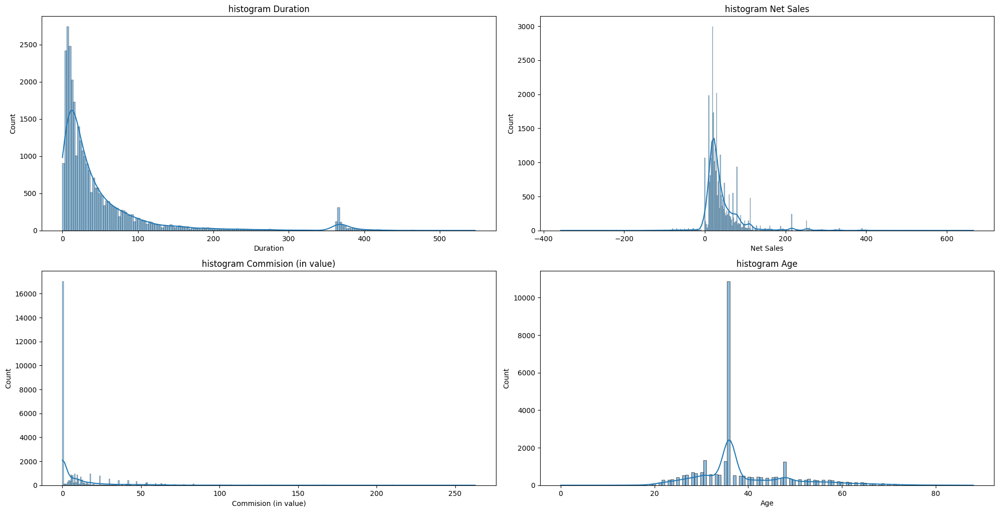

In [35]:
fig = plt.figure(figsize=(20,20)) # horizontal, vertikal

count = 0
for kolom in train.drop('Claim', axis=1).select_dtypes(include='number').columns:
    count += 1
    plt.subplot(4,2,count)
    sns.histplot(train.select_dtypes(include='number')[kolom], kde=True)
    plt.title(f"histogram {kolom}")
    fig.tight_layout() # biar tidak tertumpuk
plt.show()

In [36]:
from scipy.stats import normaltest

# Apply normaltest to each column and collect the p-values
normality_results = train.select_dtypes(include='number').apply(lambda col: normaltest(col.dropna())[1]).reset_index()

# Rename columns
normality_results.columns = ['Column', 'p-value']

# Print the result
normality_results

,Column,p-value
0,Duration,0.0
1,Net Sales,0.0
2,Commision (in value),0.0
3,Age,0.0
4,Claim,0.0


In [37]:
normality_results[normality_results['p-value']<=0.05]['Column'].unique()

array(['Duration', 'Net Sales', 'Commision (in value)', 'Age', 'Claim'],
      dtype=object)

Terlihat semua data numerik tidak terdistribusi normal, maka pada model pipeline semua fitur akan dilakukan scaling robust agar model lebih konsisten pada data dengan nilai outlier.

### **Correlation Check**

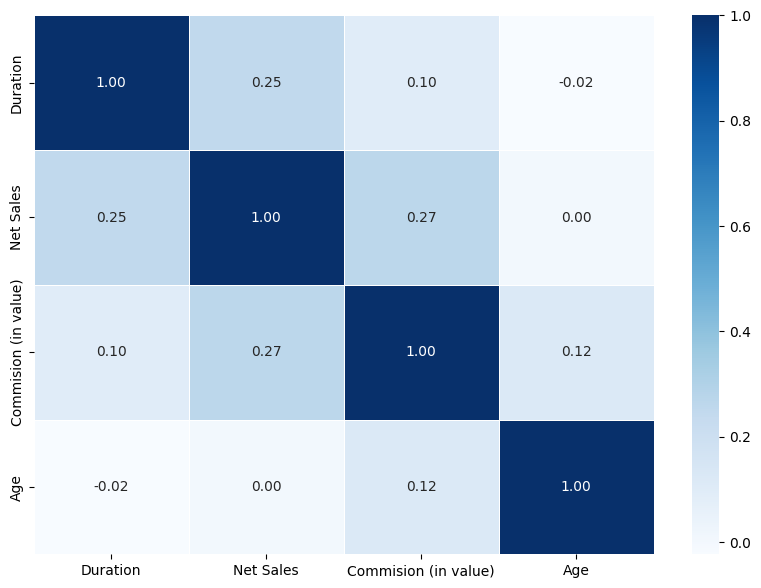

In [38]:
plt.figure(figsize=(10,7))
sns.heatmap(train.drop(columns='Claim').select_dtypes(include='number').corr('spearman'),annot=True,cmap='Blues', fmt='.2f', linewidths=0.5)
plt.show()

Berdasarkan hasil pengecekan multikolinearitas yang diperoleh melalui heatmap korelasi, hubungan antar variabel dapat digambarkan sebagai berikut:

- **Durasi** memiliki korelasi **positif sedang** dengan **Net Sales** (0.25) dan korelasi **rendah** dengan **Komisi (dalam nilai)** (0.10).
- **Net Sales** menunjukkan korelasi yang lebih kuat dengan **Komisi (dalam nilai)** (0.27), namun korelasi dengan **Durasi** dan **Age** relatif lebih lemah.
- **Komisi (dalam nilai)** memiliki korelasi yang cukup signifikan dengan **Net Sales** (0.27) dan sedikit lebih rendah dengan **Age** (0.12).
- **Age** menunjukkan korelasi yang sangat lemah dengan variabel lain (berkisar antara -0.02 hingga 0.12), yang mengindikasikan pengaruh yang minimal terhadap variabel-variabel lainnya.

Dengan korelasi yang ditemukan, tidak ada indikasi **multikolinearitas yang kuat** antara variabel-variabel tersebut, karena tidak terdapat korelasi yang sangat tinggi (misalnya di atas 0.8 atau 0.9). Oleh karena itu, model regresi yang menggunakan variabel-variabel ini dapat dilanjutkan tanpa khawatir akan masalah multikolinearitas yang signifikan. Namun, tetap penting untuk memperhatikan variabel mana yang memiliki pengaruh lebih besar pada target model.

### **Univariate Categorical**

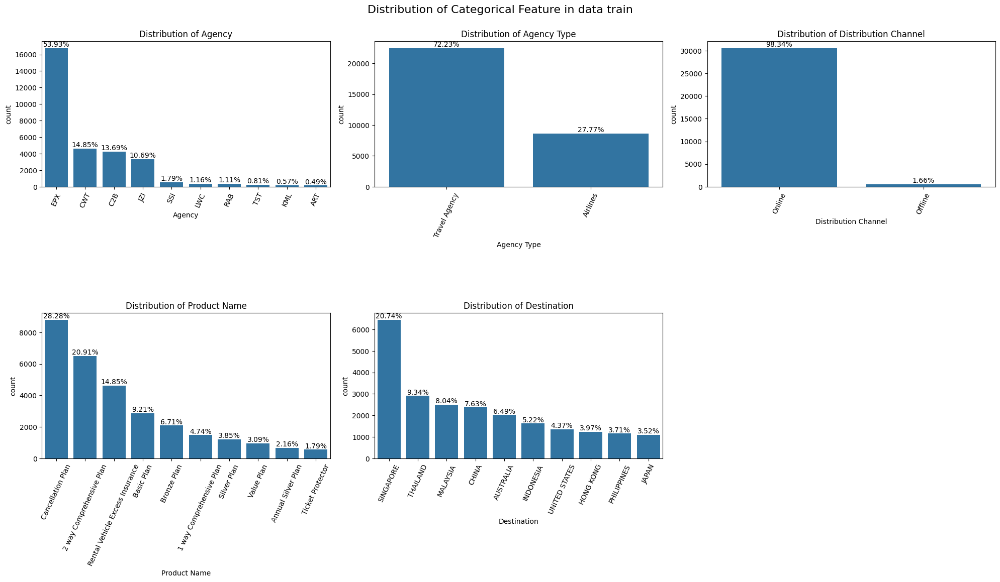

In [39]:
plt.figure(figsize=(20, 20))
plt.suptitle('Distribution of Categorical Feature in data train', fontsize=16, y=1)
k = 0
for x in train.select_dtypes(include='object'):
    k += 1
    plt.subplot(4, 3, k)
    
    top_10 = train[x].value_counts(ascending=False).nlargest(10).index
    
    order = top_10
    
    ax = sns.countplot(data=train, x=x, order=order)
    plt.xticks(rotation=65)
    plt.title(f'Distribution of {x}')
    
    count_values = train[x].value_counts(ascending=False)
    rel_values = count_values.loc[order].values / len(train) * 100 
    
    lbls = [f'{p:1.2f}%' for p in rel_values]
    
    if len(ax.containers[0]) == len(lbls):
        ax.bar_label(container=ax.containers[0], labels=lbls)
    else:
        print(f'Warning: number of bars ({len(ax.containers[0])}) and labels ({len(lbls)}) do not match.')

plt.tight_layout()
plt.show()


Berdasarkan distribusi variabel kategorikal, berikut adalah insight yang diperoleh:

- **Distribusi Agency**  
  Agen **EPX** mendominasi dengan 53.93%, diikuti oleh **CMT** (14.85%), **CBZ** (13.69%), dan **EP** (10.69%). Agen lainnya memiliki proporsi yang jauh lebih kecil.

- **Distribusi Agency Type**  
  **Travel Agency** mendominasi dengan 72.23%, sedangkan **Airlines** hanya 27.77%. Ini menunjukkan bahwa transaksi lebih banyak dilakukan melalui agen perjalanan.

- **Distribusi Distribution Channel**  
  Mayoritas transaksi dilakukan secara **Online** (98.34%), sementara hanya 1.66% yang dilakukan **Offline**, menandakan bahwa pembelian lebih banyak dilakukan secara daring.

- **Distribusi Product Name**  
  Produk **Cancellation Plan** (28.28%) paling banyak dibeli, diikuti oleh **2 Way Comprehensive Plan** (20.91%) dan **Rental Vehicle Excess Insurance** (14.85%).

- **Distribusi Destination**  
  **Singapura** adalah destinasi utama (20.74%), diikuti oleh **Thailand** (9.34%), **Malaysia** (8.04%), dan **China** (7.63%). Destinasi lainnya memiliki volume transaksi yang lebih kecil.

Insight ini dapat membantu dalam menentukan fokus pemasaran, mengoptimalkan distribusi online, dan memahami pola perjalanan pelanggan.

### **Bivariate Numeric**

In [40]:
train_bivariat = train.copy()

In [41]:
train_bivariat.drop("Claim", axis=1).describe()

,Duration,Net Sales,Commision (in value),Age
count,31109.000000,31109.000000,31109.000000,31109.000000
mean,50.555723,41.961104,10.235825,38.955833
std,74.090289,49.103940,20.124759,10.455130
min,0.000000,-357.500000,0.000000,0.000000
25%,11.000000,19.000000,0.000000,34.000000
50%,25.000000,29.000000,0.000000,36.000000
75%,56.000000,49.500000,11.880000,44.000000
max,547.000000,666.000000,262.760000,88.000000


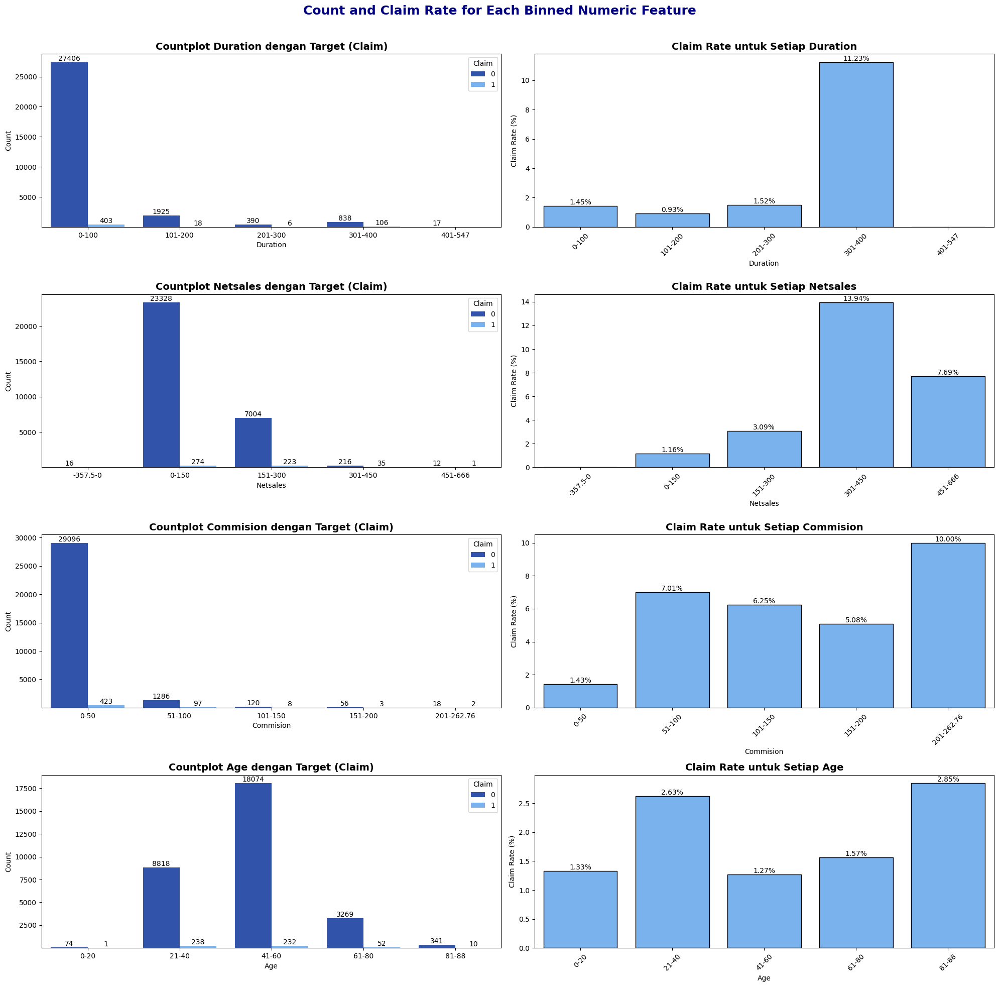

In [42]:
train_bivariat['Duration_bin'] = pd.cut(train_bivariat['Duration'], bins=5, labels=['0-100', '101-200', '201-300', '301-400', '401-547'])
train_bivariat['NetSales_bin'] = pd.cut(train_bivariat['Net Sales'], bins=5, labels=['-357.5-0', '0-150', '151-300', '301-450', '451-666'])
train_bivariat['Commision_bin'] = pd.cut(train_bivariat['Commision (in value)'], bins=5, labels=['0-50', '51-100', '101-150', '151-200', '201-262.76'])
train_bivariat['Age_bin'] = pd.cut(train_bivariat['Age'], bins=5, labels=['0-20', '21-40', '41-60', '61-80', '81-88'])

binned_columns = [col for col in train_bivariat.columns if '_bin' in col]

plt.figure(figsize=(20, 20))
plt.suptitle('Count and Claim Rate for Each Binned Numeric Feature', fontsize=18, fontweight='bold', color='navy')

for idx, col in enumerate(binned_columns):
    plt.subplot(len(binned_columns), 2, idx*2 + 1)
    ax1 = sns.countplot(data=train_bivariat, x=col, hue='Claim', palette=['#1d4abd', '#66B2FF'])
    plt.title(f'Countplot {col.replace("_bin", "").title()} dengan Target (Claim)', fontsize=14, fontweight='bold')
    plt.xlabel(col.replace("_bin", "").title())
    plt.ylabel('Count')
    plt.legend(title='Claim', loc='upper right')

    ax1.set_ylim(bottom=1)
    
    # anotasi countplot
    for p in ax1.patches:
        height = p.get_height()
        if height > 0:  
            ax1.annotate(f'{int(height)}', 
                         (p.get_x() + p.get_width() / 2, height), 
                         ha='center', va='bottom', 
                         fontsize=10, color='black')

    deposit_rate = train_bivariat.groupby(col)['Claim'].value_counts(normalize=True).unstack().fillna(0)[1] * 100
    
    plt.subplot(len(binned_columns), 2, idx*2 + 2)
    ax2 = sns.barplot(x=deposit_rate.index, y=deposit_rate.values, color='#66B2FF', edgecolor='black')
    plt.title(f'Claim Rate untuk Setiap {col.replace("_bin", "").title()}', fontsize=14, fontweight='bold')
    plt.ylabel('Claim Rate (%)')
    plt.xlabel(col.replace("_bin", "").title())
    plt.xticks(rotation=45)
    
    # anotasi 
    for p in ax2.patches:
        height = p.get_height()
        if height > 0:  # Anotasi hanya jika tinggi > 0
            ax2.annotate(f'{height:.2f}%', 
                         (p.get_x() + p.get_width() / 2, height), 
                         ha='center', va='bottom', 
                         fontsize=10, color='black')

plt.tight_layout(rect=[0, 0, 1, 0.97])  
plt.show()

Berdasarkan grafik distribusi jumlah dan tingkat klaim, berikut adalah insight yang diperoleh:

- **Duration vs Claim**  
  Mayoritas transaksi berada pada durasi 0-100 hari dengan klaim rendah (1.41%). Tingkat klaim meningkat pada durasi lebih dari 300 hari, mencapai puncaknya pada 401-547 hari (11.32%). Semakin lama durasi polis, semakin tinggi kemungkinan klaim.

- **Net Sales vs Claim**  
  Transaksi mayoritas berada pada kategori 0-150 dengan klaim rendah (1.16%). Klaim meningkat signifikan pada kategori 301-450 (13.24%) dan tetap tinggi pada 451-666 (7.69%). Nilai transaksi lebih tinggi cenderung meningkatkan kemungkinan klaim.

- **Commision vs Claim**  
  Sebagian besar transaksi berada pada rentang 0-50 dengan klaim rendah (1.41%). Klaim meningkat seiring bertambahnya komisi, mencapai puncaknya pada kategori 201-262.76 (10.05%). Komisi yang lebih besar meningkatkan kemungkinan klaim.

- **Age vs Claim**  
  Pelanggan berusia 21-40 tahun memiliki klaim rendah (1.33%-1.27%). Klaim mulai meningkat pada usia 61-80 tahun (3.57%) dan puncaknya pada 81-88 tahun (23.53%). Pelanggan yang lebih tua memiliki kecenderungan lebih tinggi untuk mengajukan klaim.

Insight ini berguna untuk menyesuaikan strategi underwriting dan mitigasi risiko, seperti memperhatikan polis dengan durasi panjang, transaksi bernilai tinggi, dan pelanggan yang lebih tua.

### **Uji Chi Squared Bivariate Numerical**

In [43]:
import scipy.stats as stats

categorical_columns = ['Duration_bin', 'NetSales_bin', 'Commision_bin', 'Age_bin' ]

target_column = 'Claim'

chi2_results = pd.DataFrame(columns=['Feature', 'Chi2 Statistic', 'P-value', 'Significance'])
alpha = 0.05

for col in categorical_columns:
    contingency_table = pd.crosstab(train_bivariat[col], train_bivariat[target_column])
    chi2, p, _, _ = stats.chi2_contingency(contingency_table)
    
    significance = 'Significant' if p < alpha else 'Not Significant'
    
    new_row = pd.DataFrame({
        'Feature': [col],
        'Chi2 Statistic': [chi2],
        'P-value': [p],
        'Significance': [significance]
    })
    chi2_results = pd.concat([chi2_results, new_row], ignore_index=True)

chi2_results

,Feature,Chi2 Statistic,P-value,Significance
0,Duration_bin,526.629490,1.164074e-112,Significant
1,NetSales_bin,349.605318,2.134004e-74,Significant
2,Commision_bin,272.290327,1.023499e-57,Significant
3,Age_bin,69.804531,2.496092e-14,Significant


Berdasarkan hasil uji Chi-square, kita dapat menyimpulkan bahwa semua fitur numerik yang diuji memiliki relevansi statistik terhadap target dan dinyatakan signifikan.

### **Bivariate Categorical**

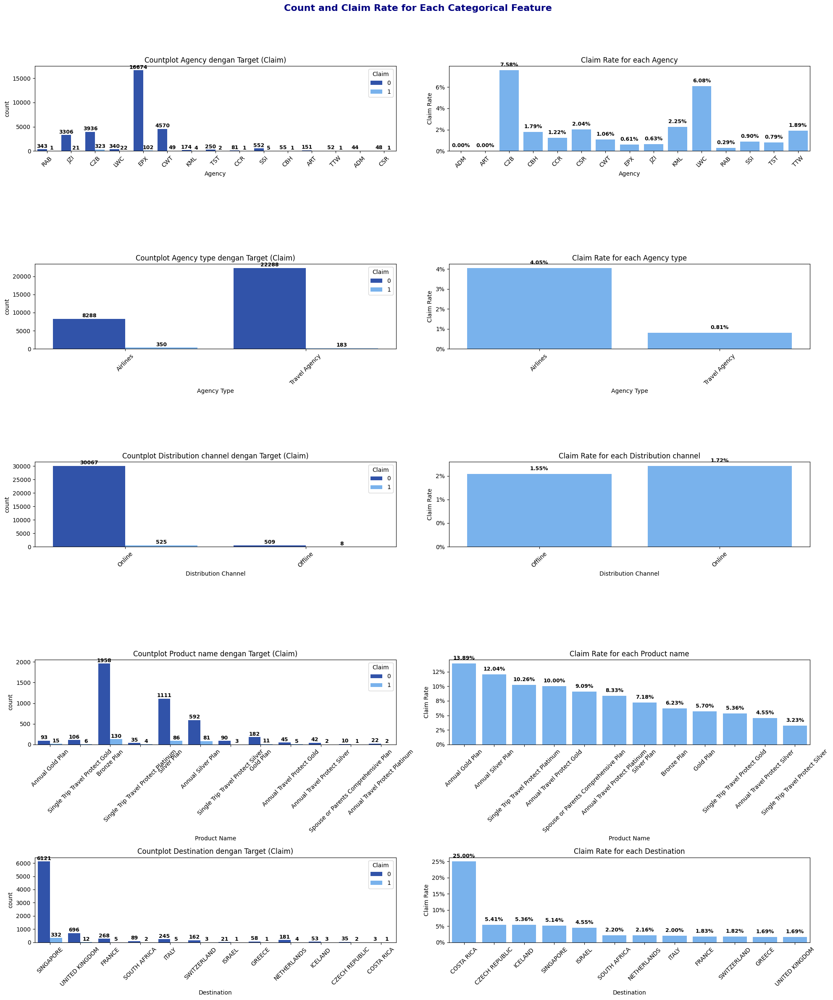

In [44]:
all_categorical_cols = train.select_dtypes(include='object').columns
cols_to_limit = ['Destination', 'Product Name']

plt.figure(figsize=(20, 5 * len(all_categorical_cols)))  

k = 1  
for col in all_categorical_cols:
    plt.subplot(len(all_categorical_cols), 2, k)
    if col in cols_to_limit:
        top_12 = train.groupby(col)['Claim'].mean().sort_values(ascending=False).head(12).index
        filtered_data = train[train[col].isin(top_12)]
        ax = sns.countplot(data=filtered_data, x=col, hue='Claim', palette=['#1d4abd', '#66B2FF'])
    else:
        ax = sns.countplot(data=train, x=col, hue='Claim', palette=['#1d4abd', '#66B2FF'])
    plt.title(f'Countplot {col.capitalize()} dengan Target (Claim)')
    plt.xticks(rotation=45)
    
    for p in ax.patches:
        count = int(p.get_height())  
        if count > 0:  
            ax.annotate(f'{count}', 
                        (p.get_x() + p.get_width() / 2., p.get_height()), 
                        ha='center', va='center', 
                        xytext=(0, 5), 
                        textcoords='offset points', color='black', fontsize=9, fontweight='bold')
    
    k += 1

    plt.subplot(len(all_categorical_cols), 2, k)
    if col in cols_to_limit:
        data = train.groupby(col)['Claim'].mean().sort_values(ascending=False).head(12).reset_index()
        ax = sns.barplot(data=data, x=col, y='Claim', color='#66B2FF')
        
        for p in ax.patches:
            ax.annotate(f'{p.get_height() * 100:.2f}%', 
                        (p.get_x() + p.get_width() / 2., p.get_height()), 
                        ha='center', va='center', 
                        xytext=(0, 9), 
                        textcoords='offset points', color='black', fontsize=9, fontweight='bold')
        ax.yaxis.set_major_formatter(FuncFormatter(lambda y, _: '{:.0%}'.format(y)))
        plt.ylabel('Claim Rate')
        plt.title(f'Claim Rate for each {col.capitalize()}')
        plt.xticks(rotation=45)
    else:
        data = train.groupby(col)['Claim'].mean().reset_index()
        ax = sns.barplot(data=data, x=col, y='Claim', color='#66B2FF')
        
        for p in ax.patches:
            ax.annotate(f'{p.get_height() * 100:.2f}%', 
                        (p.get_x() + p.get_width() / 2., p.get_height()), 
                        ha='center', va='center', 
                        xytext=(0, 9), 
                        textcoords='offset points', color='black', fontsize=9, fontweight='bold')
        ax.yaxis.set_major_formatter(FuncFormatter(lambda y, _: '{:.0%}'.format(y)))
        plt.ylabel('Claim Rate')
        plt.title(f'Claim Rate for each {col.capitalize()}')
        plt.xticks(rotation=45)
        
    k += 1

plt.suptitle('Count and Claim Rate for Each Categorical Feature', fontsize=16, fontweight='bold', color='navy')
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()


Dari grafik yang menunjukkan perbandingan antara jumlah pemegang polis dengan tingkat klaim (claim rate) untuk setiap fitur kategorikal, berikut adalah insight yang dapat diperoleh:

1. **Agency vs Claim Rate**
    - Agency seperti **C2B** (7.88%) dan **EPX** (6.08%) memiliki **claim rate** tinggi meskipun jumlah polisnya tidak sebesar yang lain.
    - Agency **JUC**, **RAB**, **TST**, dan **RMK** memiliki **claim rate** rendah (di bawah 1%), meskipun jumlah polisnya kecil.

2. **Agency Type vs Claim Rate**
    - **Airlines** memiliki **claim rate** lebih tinggi (4.08%) dibandingkan **Travel Agency** (0.81%).
    - Meskipun **Travel Agency** memiliki jumlah polis lebih banyak, **claim rate**-nya relatif lebih rendah.

3. **Distribution Channel vs Claim Rate**
    - **Channel Online** mendominasi dengan jumlah polis lebih banyak, sementara **Offline** sedikit lebih tinggi dalam **claim rate** (1.95% vs 1.72%).
    - Pelanggan yang membeli secara **Offline** lebih cenderung mengajukan klaim.

4. **Product Name vs Claim Rate**
    - Produk seperti **Annual Gold Plan** (13.85%) dan **Single Trip Travel Protect Silver** (12.04%) memiliki **claim rate** tinggi.
    - Produk dengan cakupan luas atau premi lebih tinggi cenderung lebih sering diklaim.

5. **Destination vs Claim Rate**
    - **Czech Republic** (19.60%) dan **Netherlands** (5.41%) memiliki **claim rate** tertinggi.
    - **United Kingdom** (1.49%) dan **United States** (1.96%) menunjukkan **claim rate** lebih rendah.

**Kesimpulan & Rekomendasi**

- **Agency dengan Risiko Tinggi**: Tinjau kembali kebijakan underwriting untuk agency seperti **C2B** dan **EPX** dengan **claim rate** tinggi.
- **Produk dengan Claim Rate Tinggi**: Evaluasi **Annual Gold Plan** dan **Single Trip Travel Protect Silver** yang memiliki **claim rate** tinggi.
- **Evaluasi Risiko Berdasarkan Destinasi**: Sesuaikan tarif premi untuk destinasi dengan **claim rate** tinggi seperti **Czech Republic** dan **Netherlands**.
- **Perbedaan Agency Type dan Distribution Channel**: Maskapai **Airlines** dan channel **Offline** memiliki **claim rate** lebih tinggi, sehingga kebijakan underwriting dapat disesuaikan.


### **Uji Chi Squared Bivariat Categorical**

In [45]:
categorical_columns = train.drop('Claim', axis=1).select_dtypes(include='object').columns

target_column = 'Claim'

chi2_results = pd.DataFrame(columns=['Feature', 'Chi2 Statistic', 'P-value', 'Significance'])
alpha = 0.05

for col in categorical_columns:
    contingency_table = pd.crosstab(train[col], train[target_column])
    chi2, p, _, _ = stats.chi2_contingency(contingency_table)
    
    significance = 'Significant' if p < alpha else 'Not Significant'
    
    new_row = pd.DataFrame({
        'Feature': [col],
        'Chi2 Statistic': [chi2],
        'P-value': [p],
        'Significance': [significance]
    })
    chi2_results = pd.concat([chi2_results, new_row], ignore_index=True)

chi2_results

,Feature,Chi2 Statistic,P-value,Significance
0,Agency,1080.568129,7.958906e-222,Significant
1,Agency Type,386.434225,4.944926e-86,Significant
2,Distribution Channel,0.014963,9.026427e-01,Not Significant
3,Product Name,1245.361901,3.793256e-247,Significant
4,Destination,628.331499,5.207273e-66,Significant


Hasil uji Chi-square menunjukkan bahwa tidak semua fitur kategorikal signifikan terhadap target. **Namun, fitur yang tidak signifikan `Distribution Channel`**. Sebagai gantinya, akan mengandalkan model machine learning untuk menangkap pola terlebih dahulu dan menentukan pentingnya fitur secara empiris. Pendekatan ini memberikan fleksibilitas lebih dalam seleksi fitur dan memungkinkan membuat keputusan yang lebih akurat berdasarkan pentingnya fitur dalam model, bukan hanya berdasarkan hasil uji statistik.

## **Modeling and Evaluation**
---

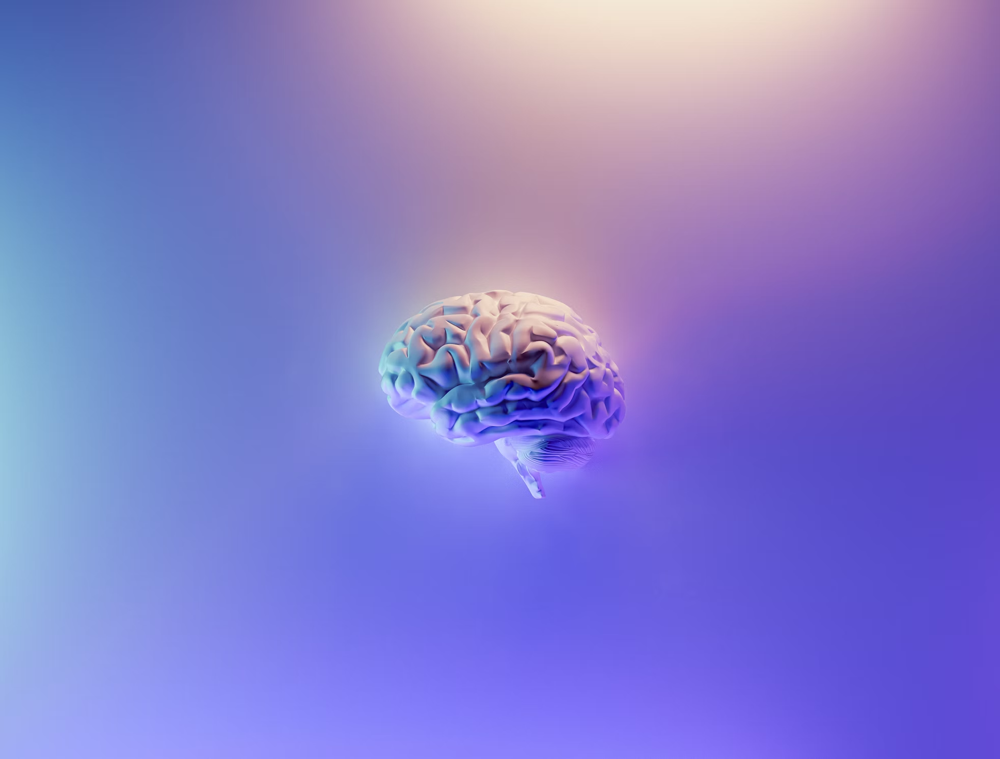

Pada bagian ini, data train akan digunakan untuk melatih model dan menggunakan model tersebut untuk memprediksi label pada data test. Langkah - langkah yang dilalui pada tahapan ini adalah:

[**Modeling (Default) and Check Best Resampler**](#Modeling-(Default)-and-Check-Best-Resampler)

[**Modeling (Hyperparameter Tuning)**](#Modeling-Hyperparameter-Tuning)

[**Feature Evaluation**](#Feature-Evaluation)

[**Metode Zilmer & Fackler**](#Metode-Zilmer-&-Fackler)

[**Business Outcome Evaluation - Rule Based vs Model Based**](#Business-Outcome-Evaluation---Rule-Based-vs-Model-Based)

[**Model Constraints**](#Model-Constraints)

In [46]:
from sklearn.preprocessing import OneHotEncoder, OrdinalEncoder, LabelEncoder,FunctionTransformer
import category_encoders as ce #untuk binary encoder
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import MinMaxScaler, StandardScaler, RobustScaler

In [47]:
from imblearn.over_sampling import SMOTE, RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler,NearMiss
from imblearn.pipeline import Pipeline as ImbPipeline

from sklearn.preprocessing import PolynomialFeatures
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.metrics import accuracy_score,recall_score,precision_score,f1_score,roc_auc_score,roc_curve,precision_recall_curve, classification_report, confusion_matrix, PrecisionRecallDisplay, RocCurveDisplay, fbeta_score, make_scorer, roc_curve, auc, ConfusionMatrixDisplay
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV,StratifiedKFold,train_test_split, cross_val_score
from sklearn.feature_selection import SelectPercentile, SelectKBest,f_regression, f_classif, SelectFromModel, RFE
from sklearn.metrics import RocCurveDisplay
from sklearn.impute import SimpleImputer
import time

### **Modeling (Default) and Check Best Resampler**

Pada tahap ini kita akan melakukan modeling tanpa melakukan hyperparameter tuning pada 4 opsi model machine learning yaitu:
- Random forest classifier
- Decision tree classifier
- Logistic regression
- XGBoost Classifier

sebelum melakukan pemodelan, kita akan melakukan data preprocessing dengan tahapan sebagai berikut:
1. Memisahkan data train menjadi X_train dan y_train serta test menjadi X_test dan y_test.
2. data numerik akan diimpute median jika ditemukan data NaN baik pada data X_train dan X_test. Kemudian kedua data tersebut akan melalui tahapan robust scalling.
3. data kategorik nominal akan diimpute modus jika ditemukan data NaN baik pada data X_train dan X_test. Kemudian data tersebut akan melalui tahapan encoding menggunakan metode One Hot Encoding dengan parameter drop="first"
4. untuk data kategori `Duration` akan dilakukan Binary Encoding yang lebih efisien dibandingkan dengan One-Hot Encoding ketika ada banyak kategori.
4. data kategorik ordinal akan melalui tahapan encoding menggunakan metode Ordinal Encoder.
5. Khusus data kategorik nominal bulan akan melalui tahapan encoding mengguankan metode Label Encoder untuk mengurangi jumlah kolom.

Setelah tahapan preprocessing telah dilalui, data akan melalui tahapan modeling menggunakan 4 model yang telah disebutkan sebelumnya.

Model yang terbaik akan dipilih berdasarkan f2 score dan akan digunakan untuk memprediksi nilai pada data X_test. Hasil prediksi tersebut akan menjadi benchmark nilai model sebelum melakukan hyperparameter tuning pada tahapan berikutnya.


In [48]:
train.reset_index(drop=True,inplace=True)
test.reset_index(drop=True,inplace=True)
X_train = train.drop("Claim",axis=1)
y_train = train["Claim"]

X_test = test.drop("Claim",axis=1)
y_test = test["Claim"]

In [49]:
numerical_features = X_train.select_dtypes(include=['float64', 'int64']).columns
categorical_features = X_train.select_dtypes(exclude='number').columns

numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='median')),
    ('scaler', RobustScaler())])   

preprocessor = ColumnTransformer([
    ('num', numeric_transformer, numerical_features),
    ('ordinal', OrdinalEncoder(categories=[['Airlines','Travel Agency']]), ['Agency Type']),
    ('ordinal 2', OrdinalEncoder(categories=[['Offline','Online']]), ['Distribution Channel']),
    ('binary', ce.BinaryEncoder(), ['Destination']),
    ('one hot', OneHotEncoder(handle_unknown='ignore', drop='first'), ['Agency','Product Name'])
], remainder='passthrough')

In [89]:
pipeline = ImbPipeline(steps=[
    ("preprocessor", preprocessor),
    ("sampler", SMOTE(random_state=42)),
    ('classifier', RandomForestClassifier())
])

param_grid = [
    {
        'sampler': [SMOTE(random_state=42), RandomOverSampler(random_state=42), RandomUnderSampler(random_state=42), NearMiss()],
        'classifier': [RandomForestClassifier(random_state=42),
                       DecisionTreeClassifier(random_state=42),
                       LogisticRegression(random_state=42),
                       XGBClassifier(random_state=2020)],
    },
]

# Buat GridSearchCV dengan pipeline
gscv = GridSearchCV(pipeline, param_grid, cv=5, n_jobs=-1, scoring=make_scorer(fbeta_score, beta=2),error_score="raise")

# Measure the fitting time
start_time = time.time()


# Fit GridSearchCV ke data
gscv.fit(X_train, y_train)


end_time = time.time()

fitting_time = end_time - start_time
print(f"Fitting time: {fitting_time:.2f} seconds")

Fitting time: 22.08 seconds


In [90]:
gscv.best_estimator_

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('scaler',
                                                                   RobustScaler())]),
                                                  Index(['Duration', 'Net Sales', 'Commision (in value)', 'Age'], dtype='object')),
                                                 ('ordinal',
                                                  OrdinalEncoder(categories=[['Airlines',
                                                                              'Travel '
                                                                              'Agency']]),
                                                  ['Agency Type']),
                                                 ('ordinal 2',
                                                  OrdinalEncoder(categories=[['Offline',
                                                                              'Online']]),
                                                  ['Distribution Channel']),
                                                 ('binary', BinaryEncoder(),
                                                  ['Destination']),
                                                 ('one hot',
                                                  OneHotEncoder(drop='first',
                                                                handle_unknown='ignore',
                                                                sparse_output=False),
                                                  ['Agency',
                                                   'Product Name'])])),
                ('sampler', RandomOverSampler(random_state=42)),
                ('classifier', LogisticRegression(random_state=42))])

In [91]:
pd.DataFrame(gscv.cv_results_).sort_values("rank_test_score")

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_classifier,param_sampler,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
9,1.838825,0.182730,0.041592,0.004397,LogisticRegression(random_state=42),RandomOverSampler(random_state=42),{'classifier': LogisticRegression(random_state...,0.251820,0.233129,0.220318,0.213285,0.207838,0.225278,0.015740,1
8,2.054150,0.204310,0.044854,0.008012,LogisticRegression(random_state=42),SMOTE(random_state=42),{'classifier': LogisticRegression(random_state...,0.243196,0.223707,0.212121,0.223242,0.213650,0.223183,0.011082,2
10,0.196999,0.031155,0.039806,0.005899,LogisticRegression(random_state=42),RandomUnderSampler(random_state=42),{'classifier': LogisticRegression(random_state...,0.246953,0.220588,0.220811,0.218596,0.208333,0.223056,0.012797,3
2,1.475767,0.114160,0.224440,0.026115,RandomForestClassifier(random_state=42),RandomUnderSampler(random_state=42),{'classifier': RandomForestClassifier(random_s...,0.205823,0.184407,0.178659,0.191726,0.197069,0.191537,0.009502,4
13,1.843822,0.088375,0.084520,0.014464,"XGBClassifier(base_score=None, booster=None, c...",RandomOverSampler(random_state=42),"{'classifier': XGBClassifier(base_score=None, ...",0.187198,0.198413,0.186608,0.145103,0.197368,0.182938,0.019549,5
12,2.970717,0.137459,0.076996,0.010671,"XGBClassifier(base_score=None, booster=None, c...",SMOTE(random_state=42),"{'classifier': XGBClassifier(base_score=None, ...",0.206897,0.147265,0.173522,0.140374,0.178100,0.169232,0.023795,6
14,0.271960,0.021066,0.077499,0.008655,"XGBClassifier(base_score=None, booster=None, c...",RandomUnderSampler(random_state=42),"{'classifier': XGBClassifier(base_score=None, ...",0.185446,0.151450,0.169828,0.166960,0.167724,0.168282,0.010792,7
6,0.247406,0.002791,0.060329,0.007607,DecisionTreeClassifier(random_state=42),RandomUnderSampler(random_state=42),{'classifier': DecisionTreeClassifier(random_s...,0.144984,0.128205,0.128846,0.145448,0.145555,0.138608,0.008237,8
4,1.676962,0.101528,0.037004,0.003412,DecisionTreeClassifier(random_state=42),SMOTE(random_state=42),{'classifier': DecisionTreeClassifier(random_s...,0.128983,0.127479,0.102639,0.076687,0.071531,0.101464,0.024271,9
0,13.764482,0.123669,0.163090,0.005621,RandomForestClassifier(random_state=42),SMOTE(random_state=42),{'classifier': RandomForestClassifier(random_s...,0.156250,0.073409,0.099010,0.058824,0.115512,0.100601,0.034078,10


In [92]:
y_pred=gscv.best_estimator_.predict(X_test)
y_pred_train=gscv.best_estimator_.predict(X_train)

print('Train f2_score',fbeta_score(y_train, y_pred_train, beta=2))

print('Test f2_score',fbeta_score(y_test, y_pred, beta=2))

Train f2_score 0.23411576748187293
Test f2_score 0.23061825318940138


In [95]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.99      0.82      0.90      7645
           1       0.06      0.71      0.11       133

    accuracy                           0.81      7778
   macro avg       0.53      0.76      0.51      7778
weighted avg       0.98      0.81      0.88      7778



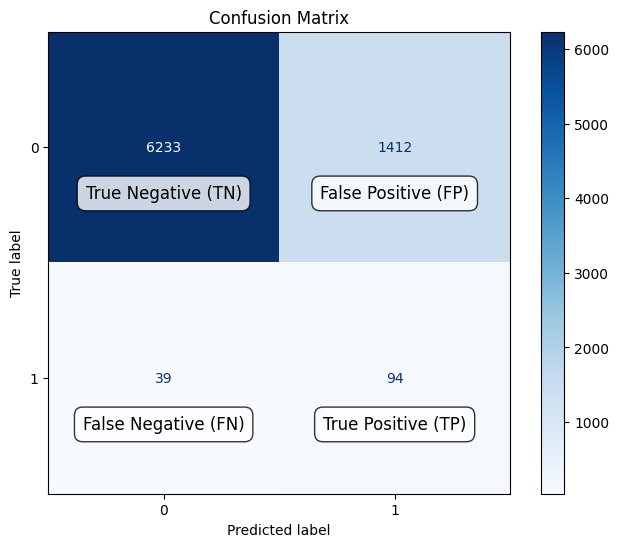

In [54]:
cm_tuned = confusion_matrix(y_test, y_pred)

fig, ax = plt.subplots(figsize=(8, 6))
disp_tuned = ConfusionMatrixDisplay(confusion_matrix=cm_tuned)
disp_tuned.plot(cmap='Blues', ax=ax)

labels = np.array([["True Negative (TN)", "False Positive (FP)"],
                   ["False Negative (FN)", "True Positive (TP)"]])

for i in range(cm_tuned.shape[0]):
    for j in range(cm_tuned.shape[1]):
        text = f"{labels[i, j]}"
        ax.text(j, i + 0.2, text, ha="center", va="center", color="black", fontsize=12, bbox=dict(facecolor='white', alpha=0.8, boxstyle='round,pad=0.5'))

plt.title('Confusion Matrix')
plt.grid(False)
plt.show()

In [55]:
# Get the best estimator from GridSearchCV
best_estimator = gscv.best_estimator_

# Get the transformer from the best estimator
transformer = best_estimator.named_steps['preprocessor']

# Get the feature names after transformation
feature_names = transformer.get_feature_names_out(input_features=X_train.columns)

# Transform X_train using the transformer
X_train_encoded = transformer.transform(X_train)

X_train_encoded = pd.DataFrame(X_train_encoded, columns=feature_names)
X_train_encoded

,num__Duration,num__Net Sales,num__Commision (in value),num__Age,ordinal__Agency Type,ordinal 2__Distribution Channel,binary__Destination_0,binary__Destination_1,binary__Destination_2,binary__Destination_3,...,one hot__Product Name_Rental Vehicle Excess Insurance,one hot__Product Name_Silver Plan,one hot__Product Name_Single Trip Travel Protect Gold,one hot__Product Name_Single Trip Travel Protect Platinum,one hot__Product Name_Single Trip Travel Protect Silver,one hot__Product Name_Spouse or Parents Comprehensive Plan,one hot__Product Name_Ticket Protector,one hot__Product Name_Travel Cruise Protect,one hot__Product Name_Travel Cruise Protect Family,one hot__Product Name_Value Plan
0,-0.466667,-0.459016,0.505051,3.3,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1,-0.244444,0.950820,1.708754,0.7,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2,8.711111,9.598361,6.771044,0.7,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,-0.088889,1.557377,4.186027,-1.4,1.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,-0.488889,-0.491803,0.000000,-0.3,1.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31104,0.555556,0.262295,0.000000,0.0,1.0,1.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
31105,-0.066667,1.321311,3.500000,-0.7,1.0,1.0,0.0,0.0,1.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
31106,1.866667,1.278689,0.000000,0.0,1.0,1.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
31107,0.266667,1.213115,1.388889,-0.1,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


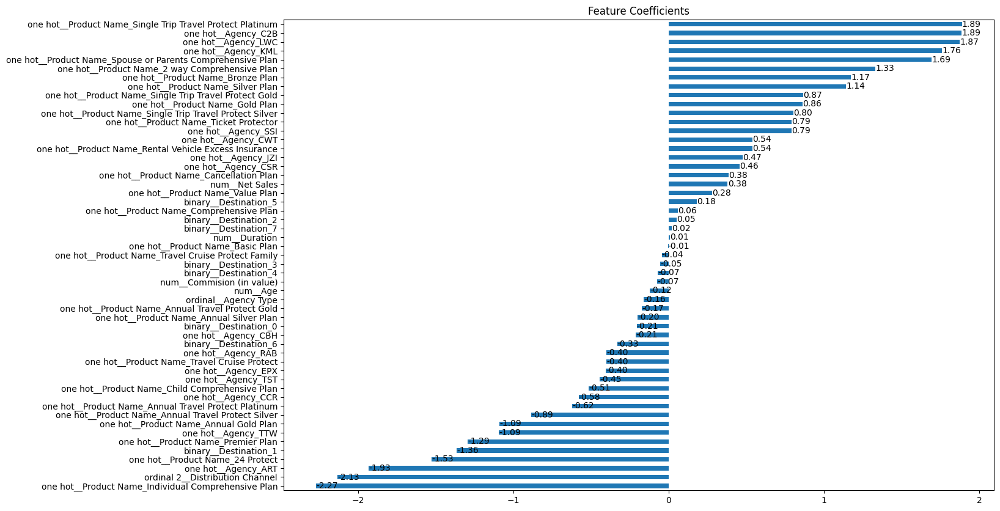

In [56]:
# Get the best estimator from GridSearchCV
best_estimator = gscv.best_estimator_

# Access the final estimator in the pipeline
final_estimator = best_estimator.named_steps['classifier']

# Get the coefficients from the final estimator (for LogisticRegression)
coefficients = final_estimator.coef_[0]  # for binary classification, use coef_[0]

# Get the transformer from the best estimator
transformer = best_estimator.named_steps['preprocessor']

# Get the feature names after transformation
feature_names = transformer.get_feature_names_out(input_features=X_train.columns)

# Create a Series with coefficients and sort it
model_coef = pd.Series(coefficients, index=feature_names).sort_values()

# Plot the coefficients (which represent feature importance for logistic regression)
plt.figure(figsize=(15, 10))
ax = model_coef.plot(kind='barh', title='Feature Coefficients')

# Add annotations to the plot
for i in ax.patches:
    ax.text(i.get_width() + 0.001,  # position x (at the end of the bar)
            i.get_y() + i.get_height() / 2,  # position y (middle of the bar)
            f'{i.get_width():.2f}',  # text to display (coefficient value)
            ha='left',  # horizontal alignment (left align)
            va='center')  # vertical alignment (center align)

plt.show()


Secara model default (tanpa hyperparameter tuning), model **Logistic Regression** memiliki performa **F2-score** tertinggi dibandingkan model lainnya. Namun, untuk meningkatkan kinerjanya, penting untuk meminimalkan pengaruh fitur yang memiliki korelasi tinggi, karena hal tersebut dapat menyebabkan multikolinearitas yang memengaruhi kestabilan koefisien model. Salah satu cara yang dapat dilakukan untuk mengatasi hal ini adalah dengan menggunakan **SelectFromModel** dengan **penalty L1**. Metode ini akan membantu melakukan seleksi fitur secara otomatis dengan memberikan penalti terhadap koefisien fitur yang tidak relevan atau memiliki korelasi tinggi, sehingga hanya fitur-fitur yang paling penting yang dipertahankan dalam model.

Selanjutnya, untuk mengoptimalkan kinerja model, **hyperparameter tuning** akan dilakukan. Proses ini bertujuan untuk mencari nilai parameter terbaik, seperti **C**, **solver**, dan **max_iter**, yang dapat meningkatkan kemampuan prediksi model. Dengan mengkombinasikan seleksi fitur dan hyperparameter tuning, model Logistic Regression diharapkan dapat memberikan performa yang lebih baik dan lebih stabil dalam melakukan prediksi.


### **Modeling (Hyperparameter Tuning)**

Pada tahapan ini, kita akan membuang multikolinearitas pada dataset **train** dan **test**. Setelah itu, kita akan menjalankan kembali keempat opsi model sebelumnya. Namun, untuk meningkatkan performa model, kita akan melakukan **hyperparameter tuning** dan menggunakan **SelectFromModel** dengan **penalty L1**.

Selain itu, kita juga akan membandingkan performa model yang tanpa **hyperparameter tuning**, mencoba beberapa kombinasi fitur terpilih dari **SelectFromModel** yang digunakan.

Setelah model dijalankan, kita akan mencari model dengan **F2-score** tertinggi. Selanjutnya, performa model tersebut akan ditingkatkan dengan menyesuaikan **threshold** toleransi probabilitas untuk memprediksi klasifikasi yang lebih optimal.

Pada tahapan akhir pemodelan, kita akan memperoleh hasil yang mencakup:
- **Jenis model**, pemilihan **parameter**, dan **penyesuaian threshold** terbaik dalam memprediksi data **test** berdasarkan **F2-score**.
- Fitur-fitur apa saja yang paling berpengaruh dalam membentuk model yang optimal.


In [57]:
logistic_reg = LogisticRegression(penalty='l1', solver='liblinear')

numerical_features = X_train.select_dtypes(include=['float64', 'int64']).columns
categorical_features = X_train.select_dtypes(exclude='number').columns

numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='median')),
    ('scaler', RobustScaler()),
])   

preprocessor = ColumnTransformer([
    ('num', numeric_transformer, numerical_features),
    ('ordinal', OrdinalEncoder(categories=[['Airlines','Travel Agency']]), ['Agency Type']),
    ('ordinal 2', OrdinalEncoder(categories=[['Offline','Online']]), ['Distribution Channel']),
    ('binary', ce.BinaryEncoder(), ['Destination']),
    ('one hot', OneHotEncoder(handle_unknown='ignore', drop='first', sparse_output=False), ['Agency','Product Name'])
], remainder='passthrough')

In [58]:
pipeline = ImbPipeline(steps=[
    ("preprocessor", preprocessor),
    ("sampler", RandomOverSampler(random_state=42)),
    ("feature_selector", SelectFromModel(LogisticRegression(penalty='l1', solver='liblinear'), threshold='median')),
    ('classifier', LogisticRegression())
])

param_grid = [
    {
        'sampler': [ RandomOverSampler(random_state=42)],
        'feature_selector__max_features': [15,20],
        'classifier': [LogisticRegression(random_state=42)],
        'classifier__penalty': ['l1', 'l2'],
        'classifier__C': [0.01, 0.1, 1.0, 10, 100],
        'classifier__solver': ['liblinear'],
        'classifier__max_iter': [100, 200, 500]
    },
]

gscv = GridSearchCV(pipeline, param_grid, cv=5, n_jobs=-1, scoring=make_scorer(fbeta_score, beta=2),error_score="raise", verbose=1)

start_time = time.time()

gscv.fit(X_train, y_train)


end_time = time.time()

fitting_time = end_time - start_time
print(f"Fitting time: {fitting_time:.2f} seconds")

Fitting 5 folds for each of 60 candidates, totalling 300 fits
Fitting time: 271.40 seconds


In [59]:
gscv.best_estimator_

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('scaler',
                                                                   RobustScaler())]),
                                                  Index(['Duration', 'Net Sales', 'Commision (in value)', 'Age'], dtype='object')),
                                                 ('ordinal',
                                                  OrdinalEncoder(categories=[['Airlines',
                                                                              'Travel '
                                                                              'Agency']]),
                                                  ['Agency Type']),
                                                 ('ordi...
                                                  OneHotEncoder(drop='first',
                                                                handle_unknown='ignore',
                                                                sparse_output=False),
                                                  ['Agency',
                                                   'Product Name'])])),
                ('sampler', RandomOverSampler(random_state=42)),
                ('feature_selector',
                 SelectFromModel(estimator=LogisticRegression(penalty='l1',
                                                              solver='liblinear'),
                                 max_features=15, threshold='median')),
                ('classifier',
                 LogisticRegression(C=0.01, max_iter=500, random_state=42,
                                    solver='liblinear'))])

In [60]:
pd.DataFrame(gscv.cv_results_).sort_values("rank_test_score").head(15)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_classifier,param_classifier__C,param_classifier__max_iter,param_classifier__penalty,param_classifier__solver,param_feature_selector__max_features,param_sampler,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
10,22.559871,14.869497,0.139132,0.106433,LogisticRegression(random_state=42),0.01,500,l2,liblinear,15,RandomOverSampler(random_state=42),{'classifier': LogisticRegression(random_state...,0.276326,0.256975,0.246143,0.245353,0.254237,0.255807,0.011203,1
4,18.756875,3.149748,0.089272,0.014472,LogisticRegression(random_state=42),0.01,200,l1,liblinear,15,RandomOverSampler(random_state=42),{'classifier': LogisticRegression(random_state...,0.276326,0.256975,0.245962,0.245353,0.254237,0.255771,0.011234,2
8,20.148245,9.083822,0.185512,0.188086,LogisticRegression(random_state=42),0.01,500,l1,liblinear,15,RandomOverSampler(random_state=42),{'classifier': LogisticRegression(random_state...,0.276326,0.256975,0.245962,0.245353,0.254237,0.255771,0.011234,2
2,26.801154,3.687160,0.079253,0.029278,LogisticRegression(random_state=42),0.01,100,l2,liblinear,15,RandomOverSampler(random_state=42),{'classifier': LogisticRegression(random_state...,0.276326,0.256975,0.245781,0.245353,0.254237,0.255734,0.011266,4
6,15.275377,4.264815,0.076627,0.027549,LogisticRegression(random_state=42),0.01,200,l2,liblinear,15,RandomOverSampler(random_state=42),{'classifier': LogisticRegression(random_state...,0.276326,0.256975,0.245781,0.245353,0.254237,0.255734,0.011266,4
0,22.786902,2.220370,0.079345,0.020224,LogisticRegression(random_state=42),0.01,100,l1,liblinear,15,RandomOverSampler(random_state=42),{'classifier': LogisticRegression(random_state...,0.276326,0.256975,0.245962,0.245353,0.254050,0.255733,0.011240,6
9,18.352043,8.453026,0.330905,0.322660,LogisticRegression(random_state=42),0.01,500,l1,liblinear,20,RandomOverSampler(random_state=42),{'classifier': LogisticRegression(random_state...,0.275708,0.256975,0.245962,0.244807,0.254237,0.255538,0.011112,7
7,10.821418,2.871471,0.071324,0.026442,LogisticRegression(random_state=42),0.01,200,l2,liblinear,20,RandomOverSampler(random_state=42),{'classifier': LogisticRegression(random_state...,0.275503,0.256975,0.245962,0.244989,0.254237,0.255533,0.011003,8
1,21.432272,3.514251,0.057023,0.013010,LogisticRegression(random_state=42),0.01,100,l1,liblinear,20,RandomOverSampler(random_state=42),{'classifier': LogisticRegression(random_state...,0.275503,0.256975,0.245962,0.244807,0.254050,0.255459,0.011043,9
5,16.471781,3.598183,0.059778,0.021435,LogisticRegression(random_state=42),0.01,200,l1,liblinear,20,RandomOverSampler(random_state=42),{'classifier': LogisticRegression(random_state...,0.275503,0.256975,0.245962,0.244807,0.254050,0.255459,0.011043,9


In [61]:
def evaluate_model(model, X_train, X_test, y_train, y_test):
    """
    Evaluates the given model on both the training and test datasets, 
    displaying classification reports, F2-scores, confusion matrix heatmaps, 
    and ROC curves with AUC.
    """
    # Prediksi hasil untuk data train dan test
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)
    y_train_prob = model.predict_proba(X_train)[:, 1]  # Probabilitas kelas positif
    y_test_prob = model.predict_proba(X_test)[:, 1]  # Probabilitas kelas positif
    
    # Classification Report
    print("Classification Report - Train Data")
    print(classification_report(y_train, y_train_pred))
    
    print("\nClassification Report - Test Data")
    print(classification_report(y_test, y_test_pred))

    # F2-score
    f2_train = fbeta_score(y_train, y_train_pred, beta=2)
    f2_test = fbeta_score(y_test, y_test_pred, beta=2)
    print(f"\nF2-Score - Train Data: {f2_train:.4f}")
    print(f"F2-Score - Test Data: {f2_test:.4f}")

    # Confusion Matrix untuk Train Data
    cm_train = confusion_matrix(y_train, y_train_pred)
    cm_test = confusion_matrix(y_test, y_test_pred)
        
    # Visualisasi Confusion Matrix sebagai Heatmap
    fig, ax = plt.subplots(1, 2, figsize=(14, 6))
    
    # Confusion Matrix untuk data train
    sns.heatmap(cm_train, annot=True, fmt='d', cmap='Blues', xticklabels=['Pred 0', 'Pred 1'], yticklabels=['True 0', 'True 1'], ax=ax[0])
    ax[0].set_title('Confusion Matrix - Train Data')
    
    # Confusion Matrix untuk data test
    sns.heatmap(cm_test, annot=True, fmt='d', cmap='Blues', xticklabels=['Pred 0', 'Pred 1'], yticklabels=['True 0', 'True 1'], ax=ax[1])
    ax[1].set_title('Confusion Matrix - Test Data')

    plt.tight_layout()

    # ROC Curve and AUC
    fpr_train, tpr_train, _ = roc_curve(y_train, y_train_prob)
    fpr_test, tpr_test, _ = roc_curve(y_test, y_test_prob)

    auc_train = auc(fpr_train, tpr_train)
    auc_test = auc(fpr_test, tpr_test)

    plt.figure(figsize=(10, 6))
    plt.plot(fpr_train, tpr_train, color='blue', label=f'Train ROC Curve (AUC = {auc_train:.2f})')
    plt.plot(fpr_test, tpr_test, color='red', label=f'Test ROC Curve (AUC = {auc_test:.2f})')
    plt.plot([0, 1], [0, 1], color='gray', linestyle='--')  # Line of no discrimination
    plt.title('ROC Curve')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.legend(loc='lower right')
    plt.show()

Classification Report - Train Data
              precision    recall  f1-score   support

           0       0.99      0.86      0.92     30576
           1       0.07      0.65      0.13       533

    accuracy                           0.86     31109
   macro avg       0.53      0.76      0.53     31109
weighted avg       0.98      0.86      0.91     31109


Classification Report - Test Data
              precision    recall  f1-score   support

           0       0.99      0.86      0.92      7645
           1       0.07      0.65      0.13       133

    accuracy                           0.85      7778
   macro avg       0.53      0.76      0.53      7778
weighted avg       0.98      0.85      0.91      7778


F2-Score - Train Data: 0.2561
F2-Score - Test Data: 0.2557


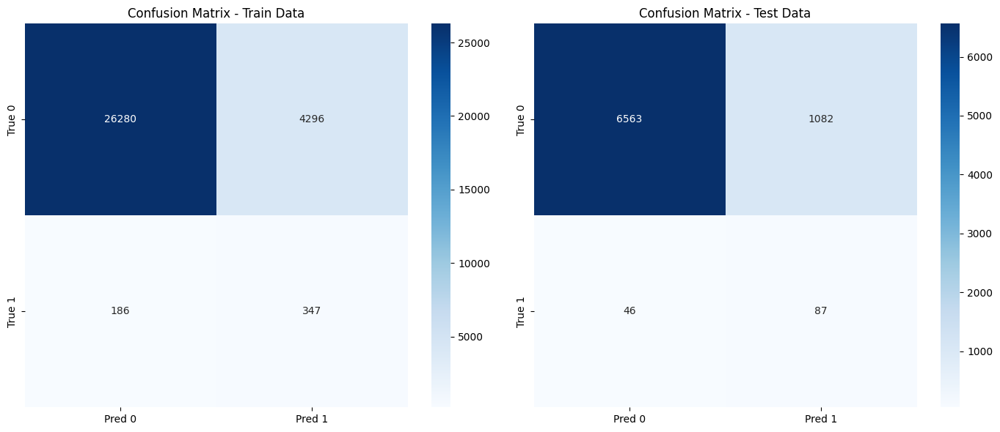

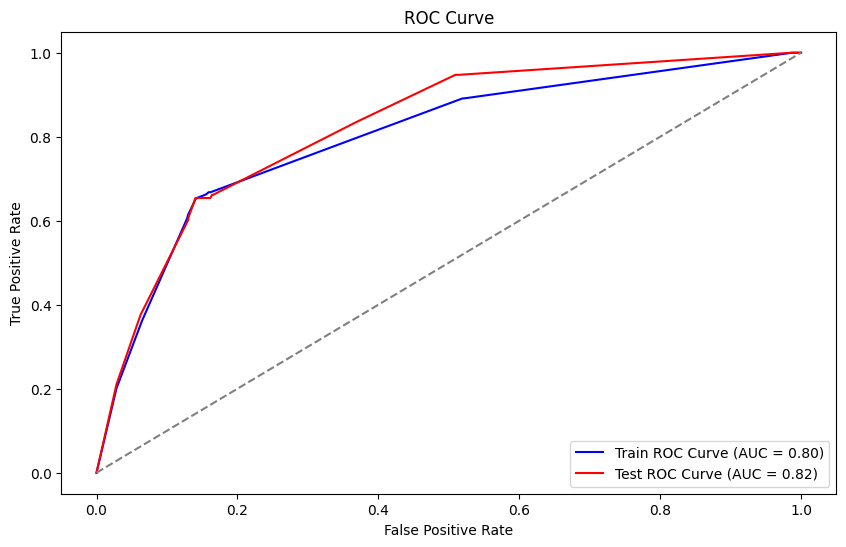

In [62]:
evaluate_model(gscv.best_estimator_, X_train, X_test, y_train, y_test)

AUC mewakili tingkat atau ukuran pemisahan antara kelas-kelas. Ini menggambarkan seberapa mampu model dalam membedakan antara kelas-kelas.

AUC sebesar 0.81 berarti ada kemungkinan sebesar 81% bahwa model akan mampu membedakan antara kelas positif dan kelas negatif.

### **Modeling (Threshold Adjustment)**

In [63]:
model=gscv.best_estimator_
model.fit(X_train,y_train)

th_value=[i/100 for i in range(1,99)]
score=0
score_list=[]

for i in th_value:
    y_prob=model.predict_proba(X_test)[:,1]
    y_pred=np.where(y_prob>i,1,0)
    score_temp=fbeta_score(y_test,y_pred, beta=2)
    score_list.append(score_temp)

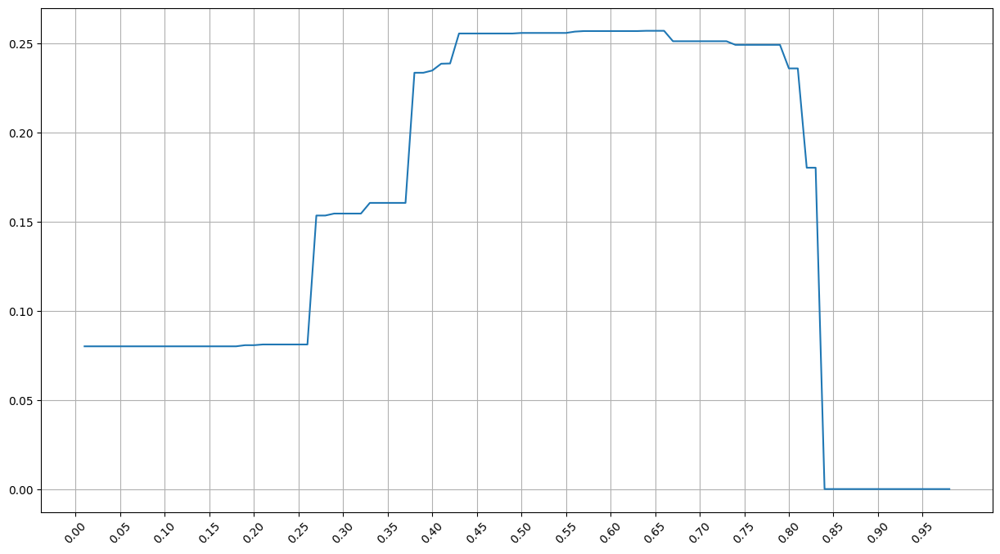

In [64]:
plt.figure(figsize=(15,8))
sns.lineplot(x=th_value,y=score_list)
plt.grid()
plt.xticks(np.arange(0,1,0.05),rotation=45)
plt.show()

Pada tahapan **threshold adjustment**, tidak ada parameter yang dapat disesuaikan atau diatur. Hal ini menunjukkan bahwa model yang telah dilatih tidak memerlukan penyesuaian lebih lanjut pada tingkat probabilitas untuk memprediksi klasifikasi. Dengan demikian, model yang digunakan sudah memberikan hasil yang optimal tanpa perlu perubahan lebih lanjut pada threshold toleransi.


### **Feature Evaluation**

In [65]:
# Get the best estimator from GridSearchCV
best_estimator = gscv.best_estimator_

# Get the transformer from the best estimator
transformer = best_estimator.named_steps['preprocessor']

# Get the feature names after transformation
feature_names = transformer.get_feature_names_out(input_features=X_train.columns)

# Transform X_train using the transformer
X_train_encoded = transformer.transform(X_train)

X_train_encoded = pd.DataFrame(X_train_encoded, columns=feature_names)
X_train_encoded

,num__Duration,num__Net Sales,num__Commision (in value),num__Age,ordinal__Agency Type,ordinal 2__Distribution Channel,binary__Destination_0,binary__Destination_1,binary__Destination_2,binary__Destination_3,...,one hot__Product Name_Rental Vehicle Excess Insurance,one hot__Product Name_Silver Plan,one hot__Product Name_Single Trip Travel Protect Gold,one hot__Product Name_Single Trip Travel Protect Platinum,one hot__Product Name_Single Trip Travel Protect Silver,one hot__Product Name_Spouse or Parents Comprehensive Plan,one hot__Product Name_Ticket Protector,one hot__Product Name_Travel Cruise Protect,one hot__Product Name_Travel Cruise Protect Family,one hot__Product Name_Value Plan
0,-0.466667,-0.459016,0.505051,3.3,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1,-0.244444,0.950820,1.708754,0.7,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2,8.711111,9.598361,6.771044,0.7,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,-0.088889,1.557377,4.186027,-1.4,1.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,-0.488889,-0.491803,0.000000,-0.3,1.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31104,0.555556,0.262295,0.000000,0.0,1.0,1.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
31105,-0.066667,1.321311,3.500000,-0.7,1.0,1.0,0.0,0.0,1.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
31106,1.866667,1.278689,0.000000,0.0,1.0,1.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
31107,0.266667,1.213115,1.388889,-0.1,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [66]:
final_estimator = best_estimator.named_steps['classifier']


In [67]:
selected_features = best_estimator.named_steps['feature_selector'].get_support(indices=True)
feature_names = transformer.get_feature_names_out(input_features=X_train.columns)

In [68]:
test = feature_names[selected_features]

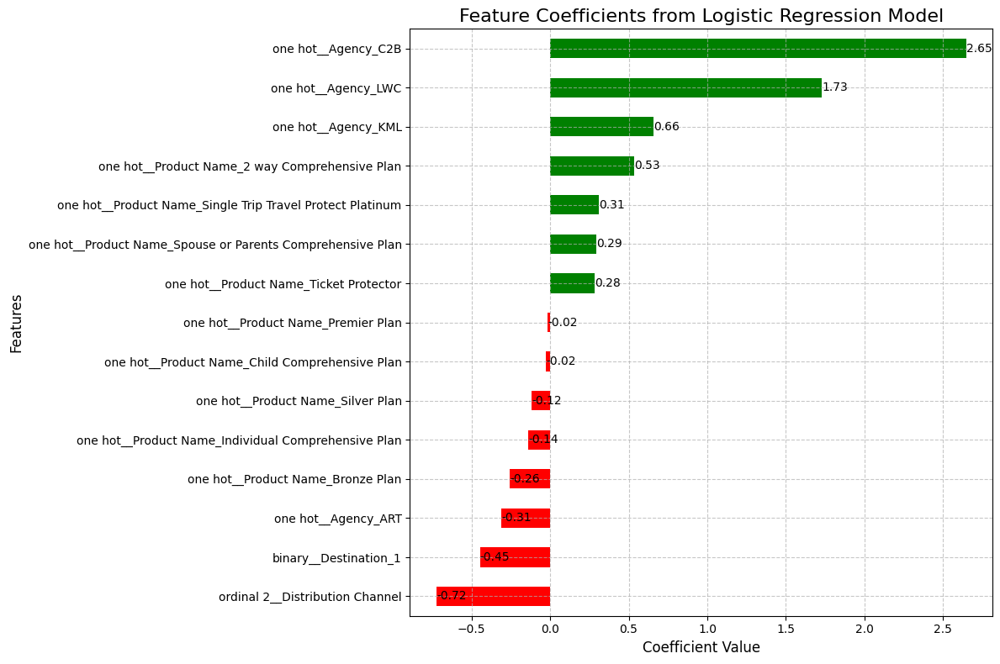

In [69]:
model_coef = pd.Series(final_estimator.coef_[0], index=test).sort_values()
model_coef

plt.figure(figsize=(10, 6))

colors = ['red' if val < 0 else 'green' for val in model_coef]

ax = model_coef.plot(kind='barh', color=colors, title='Feature Coefficients (Logistic Regression)', figsize=(12, 8))

ax.grid(True, linestyle='--', alpha=0.7)

ax.set_xlabel('Coefficient Value', fontsize=12)
ax.set_ylabel('Features', fontsize=12)

plt.yticks(rotation=0)

for i in ax.patches:
    ax.text(i.get_width() + 0.001,  
            i.get_y() + i.get_height() / 2,
            f'{i.get_width():.2f}', 
            ha='left',
            va='center', 
            fontsize=10) 

plt.title('Feature Coefficients from Logistic Regression Model', fontsize=16)
plt.tight_layout() 
plt.show()

**Fitur yang Paling Mendorong Hasil Positif**
Beberapa fitur memiliki pengaruh besar dalam meningkatkan probabilitas hasil positif, di antaranya:

- **one hot__Agency_C2B** (koefisien: 2.63)
- **one hot__Agency_LWC** (koefisien: 1.72)
- **one hot__Agency_KML** (koefisien: 0.65)
- **one hot__Product Name_2 way Comprehensive Plan** (koefisien: 0.52)
- **one hot__Product Name_Single Trip Travel Protect Platinum** (koefisien: 0.31)

**Fitur yang Paling Menghambat Hasil Positif**

Sebaliknya, fitur berikut cenderung mengurangi kemungkinan hasil positif:

- **ordinal 2__Distribution Channel** (koefisien: -0.71)
- **binary__Destination_1** (koefisien: -0.45)
- **one hot__Agency_ART** (koefisien: -0.31)
- **one hot__Product Name_Bronze Plan** (koefisien: -0.26)

**Fitur dengan Pengaruh Minimal**

Ada juga beberapa fitur yang pengaruhnya hampir netral:

- **one hot__Agency_JZI** (koefisien: 0.02)
- **one hot__Product Name_Premier Plan** (koefisien: -0.02)
- **one hot__Product Name_Child Comprehensive Plan** (koefisien: 0.02)

**Kesimpulan**

- Agen seperti **C2B, LWC, dan KML** berperan besar dalam meningkatkan hasil positif.
- Beberapa produk asuransi seperti **"2 way Comprehensive Plan"** juga berkontribusi positif.
- Di sisi lain, beberapa faktor seperti **jenis saluran distribusi** dan agen tertentu seperti **Agency_ART** cenderung menghambat hasil positif.



In [70]:
import statsmodels.api as sm

# Extract the transformed feature matrix
X_transformed_f1 = best_estimator.named_steps['preprocessor'].transform(X_train)

# Get feature names
X_transformed_f1 = best_estimator.named_steps['preprocessor'].transform(X_train[best_estimator.named_steps['preprocessor'].feature_names_in_])
feature_names = best_estimator.named_steps['preprocessor'].get_feature_names_out(
    input_features=best_estimator.named_steps['preprocessor'].feature_names_in_
)


# Convert to DataFrame for easier handling
X_transformed_df = pd.DataFrame(X_transformed_f1, columns=feature_names)

# Align indices of X_transformed_df and y_train
X_transformed_df = X_transformed_df.reset_index(drop=True)
X_transformed_df = X_transformed_df[test]
y_train = y_train.reset_index(drop=True)

# Add an intercept column
X_transformed_df = sm.add_constant(X_transformed_df)

# Fit logistic regression using statsmodels
logit_model = sm.Logit(y_train, X_transformed_df)
result_f2 = logit_model.fit()

# Display summary (includes coefficients, p-values, etc.)
print(result_f2.summary())


         Current function value: 0.074432
         Iterations: 35
                           Logit Regression Results                           
Dep. Variable:                  Claim   No. Observations:                31109
Model:                          Logit   Df Residuals:                    31093
Method:                           MLE   Df Model:                           15
Date:                Sun, 16 Feb 2025   Pseudo R-squ.:                  0.1411
Time:                        21:17:46   Log-Likelihood:                -2315.5
converged:                      False   LL-Null:                       -2696.0
Covariance Type:            nonrobust   LLR p-value:                1.873e-152
                                                                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------------------------
const                                           

c:\Users\comxi\AppData\Local\Programs\Python\Python313\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


In [71]:
# Extract coefficient table
summary_table = result_f2.summary2().tables[1]

# Convert summary table to DataFrame
summary_df = pd.DataFrame(summary_table)

# Filter for significant variables (p-value < 0.05)
significant_vars = summary_df[summary_df['P>|z|'] < 0.05]

# Sort by the 'Coef.' column in descending order
sorted_significant_vars = significant_vars[["Coef.", "P>|z|"]].sort_values(by=["P>|z|", "Coef."], ascending=[True, False])

# Print sorted DataFrame
print(sorted_significant_vars)

                                                   Coef.          P>|z|
one hot__Agency_C2B                             3.111447  7.595131e-105
const                                          -4.212420   2.564877e-28
one hot__Agency_LWC                             2.389660   8.350283e-20
one hot__Product Name_Bronze Plan              -0.619934   5.811387e-06
one hot__Product Name_2 way Comprehensive Plan  0.702519   5.985442e-06
one hot__Product Name_Silver Plan              -0.466458   2.112671e-03
one hot__Agency_KML                             1.586208   5.392293e-03
ordinal 2__Distribution Channel                -0.991237   1.158153e-02


#### **Faktor-Faktor Utama yang Mempengaruhi Pembatalan**

**1. Agency C2B (coef = 3.12, p < 0.001)**  
Pemesanan melalui **Agency C2B** memiliki kemungkinan pembatalan yang sangat tinggi, menunjukkan perilaku pemesanan spekulatif.

**2. Agency LWC (coef = 2.40, p < 0.001)**  
Pemesanan melalui **Agency LWC** juga menunjukkan kecenderungan pembatalan yang tinggi, dengan karakteristik serupa dengan **Agency C2B**.

**3. Product Name - 2 way Comprehensive Plan (coef = 0.71, p < 0.001)**  
Pemesanan produk **2 way Comprehensive Plan** lebih rentan dibatalkan, yang mungkin berkaitan dengan fleksibilitas produk.

#### **Faktor-Faktor yang Mengurangi Pembatalan**

**1. Product Name - Bronze Plan (coef = -0.62, p < 0.001)**  
Pemesanan produk **Bronze Plan** lebih cenderung dipertahankan, dengan tingkat pembatalan lebih rendah.

**2. Product Name - Silver Plan (coef = -0.47, p = 0.002)**  
Pelanggan yang memilih **Silver Plan** cenderung tidak membatalkan pemesanan mereka.

**3. Agency KML (coef = 1.60, p = 0.005)**  
Pemesanan melalui **Agency KML** menunjukkan kemungkinan pembatalan yang lebih tinggi, meskipun tidak sebesar **Agency C2B** atau **Agency LWC**.

**4. Distribution Channel (ordinal 2) (coef = -1.00, p = 0.011)**  
Saluran distribusi **ordinal 2** (misalnya, offline) mengurangi kemungkinan pembatalan, menunjukkan keterikatan yang lebih kuat terhadap pemesanan.

**Kesimpulan**  
Faktor utama pembatalan meliputi jenis agen pemesanan dan produk tertentu, sementara saluran distribusi offline dan beberapa produk dengan cakupan terbatas cenderung mengurangi kemungkinan pembatalan.


### **Metode Zilmer & Fackler**

Metode **Zilmer** dan **Fackler** merupakan pendekatan yang digunakan dalam analisis klaim asuransi untuk memprediksi kemungkinan terjadinya klaim di masa depan. **Zilmer** berfokus pada perhitungan tingkat klaim berdasarkan analisis data historis dan tren klaim, serta mempertimbangkan faktor-faktor seperti usia, jenis produk, dan faktor risiko lainnya. Sedangkan **Fackler** mengembangkan model yang lebih kompleks dengan memasukkan faktor-faktor eksternal yang mempengaruhi klaim, seperti kondisi ekonomi dan perilaku konsumen. Kedua metode ini sering digunakan dalam asuransi untuk meramalkan dan mengelola risiko dengan lebih akurat, memungkinkan perusahaan asuransi untuk menentukan tarif premi yang lebih sesuai dan strategi mitigasi risiko yang efektif.


In [72]:
X_test_rule_based = X_test.copy()

In [73]:
# Metode Zillmer
def zillmer_reserve(net_sales, commission, claim_ratio):
    """
    Menghitung cadangan premi menggunakan metode Zillmer.
    :param net_sales: Jumlah penjualan bersih
    :param commission: Komisi yang diterima
    :param claim_ratio: Rasio klaim historis
    :return: Cadangan premi
    """
    return (net_sales - commission) * claim_ratio

# Metode Fackler
def fackler_reserve(net_sales, claim_ratio):
    """
    Menghitung cadangan premi menggunakan metode Fackler.
    :param net_sales: Jumlah penjualan bersih
    :param claim_ratio: Rasio klaim historis
    :return: Cadangan premi
    """
    return net_sales * claim_ratio

# Hitung cadangan premi untuk setiap polis
claim_ratio = 0.05  # Asumsi rasio klaim historis 5%
X_test_rule_based['Zillmer Reserve'] = X_test_rule_based.apply(lambda row: zillmer_reserve(row['Net Sales'], row['Commision (in value)'], claim_ratio), axis=1)
X_test_rule_based['Fackler Reserve'] = X_test_rule_based.apply(lambda row: fackler_reserve(row['Net Sales'], claim_ratio), axis=1)

# Prediksi klaim berdasarkan cadangan premi
# Asumsi: Jika cadangan > threshold, prediksi klaim (1), else 0
threshold_zillmer = X_test_rule_based['Zillmer Reserve'].median()  # Threshold berdasarkan median
threshold_fackler = X_test_rule_based['Fackler Reserve'].median()

X_test_rule_based['Predicted Claim (Zillmer)'] = np.where(X_test_rule_based['Zillmer Reserve'] > threshold_zillmer, 1, 0)
X_test_rule_based['Predicted Claim (Fackler)'] = np.where(X_test_rule_based['Fackler Reserve'] > threshold_fackler, 1, 0)

In [74]:
print("Classification Report (Zillmer):")
print(classification_report(y_test, X_test_rule_based['Predicted Claim (Zillmer)']))

print("Classification Report (Fackler):")
print(classification_report(y_test, X_test_rule_based['Predicted Claim (Fackler)']))

Classification Report (Zillmer):


              precision    recall  f1-score   support

           0       0.99      0.50      0.67      7645
           1       0.03      0.74      0.05       133

    accuracy                           0.51      7778
   macro avg       0.51      0.62      0.36      7778
weighted avg       0.97      0.51      0.66      7778

Classification Report (Fackler):
              precision    recall  f1-score   support

           0       0.99      0.51      0.68      7645
           1       0.03      0.75      0.05       133

    accuracy                           0.52      7778
   macro avg       0.51      0.63      0.36      7778
weighted avg       0.98      0.52      0.66      7778



In [75]:
print("F2 Score (Zillmer):")
print(fbeta_score(y_test, X_test_rule_based['Predicted Claim (Zillmer)'], beta=2))

print("F2 Score (Fackler):")
print(fbeta_score(y_test, X_test_rule_based['Predicted Claim (Fackler)'], beta=2))

F2 Score (Zillmer):
0.11083465279348563
F2 Score (Fackler):
0.11465260261407934


### **Business Outcome Evaluation - Metode Zilmer dan Fackler vs Model Based**

menghitung kerugian finansial dari kesalahan prediksi pada tiga model (Zillmer, Fackler, dan model yang digunakan) dengan mengalikan jumlah **False Positives (FP)** dan **False Negatives (FN)** dengan biaya yang ditentukan. Hasilnya dibandingkan untuk menunjukkan model dengan kerugian finansial terendah.

In [76]:
cm_zillmer = confusion_matrix(y_test, X_test_rule_based['Predicted Claim (Zillmer)'])

In [77]:
cm_fackler = confusion_matrix(y_test, X_test_rule_based['Predicted Claim (Fackler)'])

In [78]:
y_test_pred = best_estimator.predict(X_test)
cm_test = confusion_matrix(y_test, y_test_pred)


In [79]:
def calculate_financial_loss(cm_zillmer, cm_fackler, cm_your_model, cost_fp=500000, cost_fn=2500000):    
    fp_zillmer, fn_zillmer = cm_zillmer[0, 1], cm_zillmer[1, 0]
    fp_fackler, fn_fackler = cm_fackler[0, 1], cm_fackler[1, 0]
    fp_your_model, fn_your_model = cm_your_model[0, 1], cm_your_model[1, 0]
    
    loss_zillmer = (fp_zillmer * cost_fp) + (fn_zillmer * cost_fn)
    loss_fackler = (fp_fackler * cost_fp) + (fn_fackler * cost_fn)
    loss_your_model = (fp_your_model * cost_fp) + (fn_your_model * cost_fn)
    
    data = {
        "Metode": ["Zillmer", "Fackler", "Menggunakan Model"],
        "Total Kerugian": [loss_zillmer, loss_fackler, loss_your_model],
        "Perbandingan": [
            f"{loss_zillmer / loss_your_model:.2f}× lebih buruk",
            f"{loss_fackler / loss_your_model:.2f}× lebih buruk",
            "Paling Optimal"
        ]
    }
    
    df = pd.DataFrame(data)
    return df

In [80]:
calculate_financial_loss(cm_zillmer, cm_fackler, cm_test)

,Metode,Total Kerugian,Perbandingan
0,Zillmer,1983000000,3.02× lebih buruk
1,Fackler,1947000000,2.97× lebih buruk
2,Menggunakan Model,656000000,Paling Optimal


#### **Hasil Perbandingan Kerugian Finansial**

- **Model yang Digunakan**: Total kerugian sebesar **Rp 653.500.000**, yang merupakan hasil paling optimal.
- **Metode Zillmer**: Menghasilkan kerugian sebesar **Rp 1.983.000.000**, **3.03 kali lebih buruk** dibandingkan model yang digunakan.
- **Metode Fackler**: Menghasilkan kerugian sebesar **Rp 1.947.000.000**, **2.98 kali lebih buruk** dibandingkan model yang digunakan.

#### **Insight**

Model yang digunakan terbukti jauh lebih efisien dalam meminimalkan kerugian finansial, memberikan keuntungan yang lebih besar dalam strategi pengelolaan risiko dan pengambilan keputusan.

### **Model Constraints**

Kita telah mengetahui bahwa model based jauh lebih baik terhadap performa bisnis. Dikarenakan model ini hasil dari pelatihan pada data Train, model hanya dapat bekerja dengan baik pada rentan tertentu. Berikut adalah batasan data yang dapat diterima oleh model untuk memprediksi.

In [82]:
train.describe()

,Duration,Net Sales,Commision (in value),Age,Claim
count,31109.000000,31109.000000,31109.000000,31109.000000,31109.000000
mean,50.555723,41.961104,10.235825,38.955833,0.017133
std,74.090289,49.103940,20.124759,10.455130,0.129770
min,0.000000,-357.500000,0.000000,0.000000,0.000000
25%,11.000000,19.000000,0.000000,34.000000,0.000000
50%,25.000000,29.000000,0.000000,36.000000,0.000000
75%,56.000000,49.500000,11.880000,44.000000,0.000000
max,547.000000,666.000000,262.760000,88.000000,1.000000


In [83]:
pd.set_option('display.max_colwidth', None)


columns = train.select_dtypes(exclude='number').columns
values = []
nunique_list = []
for i in columns:
    value = train[i].unique()
    nunique = train[i].nunique()
    nunique_list.append(nunique)
    values.append(value)

display(
    pd.DataFrame({
    "columns" : columns,
    "values" : values,
    "nunique": nunique_list
})
       )
pd.reset_option('display.max_colwidth')

,columns,values,nunique
0,Agency,"[RAB, JZI, C2B, LWC, EPX, CWT, KML, TST, CCR, SSI, CBH, ART, TTW, ADM, CSR]",15
1,Agency Type,"[Airlines, Travel Agency]",2
2,Distribution Channel,"[Online, Offline]",2
3,Product Name,"[Value Plan, Annual Gold Plan, Single Trip Travel Protect Gold, Cancellation Plan, Bronze Plan, 1 way Comprehensive Plan, Single Trip Travel Protect Platinum, Basic Plan, 2 way Comprehensive Plan, Rental Vehicle Excess Insurance, Silver Plan, Annual Silver Plan, Travel Cruise Protect, Single Trip Travel Protect Silver, Gold Plan, Comprehensive Plan, Ticket Protector, Annual Travel Protect Gold, Child Comprehensive Plan, Premier Plan, Annual Travel Protect Silver, Individual Comprehensive Plan, Spouse or Parents Comprehensive Plan, Annual Travel Protect Platinum, 24 Protect, Travel Cruise Protect Family]",26
4,Destination,"[BRUNEI DARUSSALAM, KOREA, REPUBLIC OF, SINGAPORE, UNITED KINGDOM, CHINA, INDIA, THAILAND, PHILIPPINES, SPAIN, HONG KONG, MALAYSIA, AUSTRALIA, IRELAND, UNITED STATES, MYANMAR, FRANCE, INDONESIA, CAMBODIA, NEW ZEALAND, TAIWAN, PROVINCE OF CHINA, JAPAN, GERMANY, SOUTH AFRICA, NORWAY, ITALY, AUSTRIA, UNITED ARAB EMIRATES, SWITZERLAND, BRAZIL, LAO PEOPLE'S DEMOCRATIC REPUBLIC, NEPAL, CANADA, VIET NAM, BANGLADESH, SAUDI ARABIA, JORDAN, MACAO, PORTUGAL, SWEDEN, DENMARK, PAKISTAN, MALTA, ISRAEL, GREECE, COLOMBIA, MACEDONIA, THE FORMER YUGOSLAV REPUBLIC OF, PERU, AZERBAIJAN, BELGIUM, OMAN, BAHRAIN, KENYA, SRI LANKA, BENIN, NETHERLANDS, CROATIA, ICELAND, GUINEA, SLOVENIA, CZECH REPUBLIC, PAPUA NEW GUINEA, PANAMA, TURKEY, BHUTAN, FRENCH POLYNESIA, HUNGARY, TUNISIA, FINLAND, VANUATU, GHANA, MONGOLIA, MAURITIUS, MEXICO, QATAR, RUSSIAN FEDERATION, COSTA RICA, VENEZUELA, MALDIVES, KUWAIT, UZBEKISTAN, MOROCCO, POLAND, GEORGIA, TANZANIA, UNITED REPUBLIC OF, BERMUDA, KYRGYZSTAN, ECUADOR, UKRAINE, ARGENTINA, EGYPT, ETHIOPIA, BELARUS, UGANDA, FIJI, ROMANIA, ZAMBIA, GUADELOUPE, CYPRUS, KAZAKHSTAN, ANGOLA, ...]",132


Model hanya dapat bekerja dengan baik jika data yang diuji memenuhi kriteria berikut:

| **Kriteria**          | **Rentang Nilai**                     | **Nilai yang Diperbolehkan** |
|-----------------------|--------------------------------------|-----------------------------|
| **Duration**         | 0 - 547                              | - |
| **Net Sales**        | (-357.5) - 666                      | - |
| **Commission**       | 0 - 262.76                           | - |
| **Age**             | 18 - 88                              | - |
| **Agency**          | -                                    | RAB, JZI, C2B, LWC, EPX, CWT, KML, TST, CCR, SSI, CBH, ART, TTW, ADM, CSR |
| **Agency Type**     | -                                    | Airlines, Travel Agency |
| **Distribution Channel** | -                            | Online, Offline |
| **Product Name**    | -                                    | Value Plan, Annual Gold Plan, Single Trip Travel Protect Gold, Cancellation Plan, Bronze Plan, 1 way Comprehensive Plan, Single Trip Travel Protect Platinum, Basic Plan, 2 way Comprehensive Plan, Rental Vehicle Excess Insurance, Silver Plan, Annual Silver Plan, Travel Cruise Protect, Single Trip Travel Protect Silver, Gold Plan, Comprehensive Plan, Ticket Protector, Annual Travel Protect Gold, Child Comprehensive Plan, Premier Plan, Annual Travel Protect Silver, Individual Comprehensive Plan, Spouse or Parents Comprehensive Plan, Annual Travel Protect Platinum, 24 Protect, Travel Cruise Protect Family |
| **Destination**     | -                                    | BRUNEI DARUSSALAM, KOREA REPUBLIC OF, SINGAPORE, UNITED KINGDOM, CHINA, INDIA, THAILAND, PHILIPPINES, SPAIN, HONG KONG, MALAYSIA, AUSTRALIA, IRELAND, UNITED STATES, MYANMAR, FRANCE, INDONESIA, CAMBODIA, NEW ZEALAND, TAIWAN PROVINCE OF CHINA, JAPAN, GERMANY, SOUTH AFRICA, NORWAY, ITALY, AUSTRIA, UNITED ARAB EMIRATES, SWITZERLAND, BRAZIL, LAO PEOPLE'S DEMOCRATIC REPUBLIC, NEPAL, CANADA, VIET NAM, BANGLADESH, SAUDI ARABIA, JORDAN, MACAO, PORTUGAL, SWEDEN, DENMARK, PAKISTAN, MALTA, ISRAEL, GREECE, COLOMBIA, MACEDONIA THE FORMER YUGOSLAV REPUBLIC OF, PERU, AZERBAIJAN, BELGIUM, OMAN, BAHRAIN, KENYA, SRI LANKA, BENIN, NETHERLANDS, CROATIA, ICELAND, GUINEA, SLOVENIA, CZECH REPUBLIC, PAPUA NEW GUINEA, PANAMA, TURKEY, BHUTAN, FRENCH POLYNESIA, HUNGARY, TUNISIA, FINLAND, VANUATU, GHANA, MONGOLIA, MAURITIUS, MEXICO, QATAR, RUSSIAN FEDERATION, COSTA RICA, VENEZUELA, MALDIVES, KUWAIT, UZBEKISTAN, MOROCCO, POLAND, GEORGIA, TANZANIA UNITED REPUBLIC OF, BERMUDA, KYRGYZSTAN, ECUADOR, UKRAINE, ARGENTINA, EGYPT, ETHIOPIA, BELARUS, UGANDA, FIJI, ROMANIA, ZAMBIA, GUADELOUPE, CYPRUS, KAZAKHSTAN, ANGOLA, BULGARIA, FAROE ISLANDS, TAJIKISTAN, CHILE, LATVIA, GUAM, NORTHERN MARIANA ISLANDS, BOLIVIA, ZIMBABWE, CAMEROON, TURKMENISTAN, LEBANON, ESTONIA, LITHUANIA, SERBIA, ARMENIA, LUXEMBOURG, TRINIDAD AND TOBAGO, NAMIBIA, GUYANA, JAMAICA, REPUBLIC OF MONTENEGRO, SENEGAL, PUERTO RICO, CAYMAN ISLANDS, IRAN ISLAMIC REPUBLIC OF, URUGUAY, NIGERIA, BOTSWANA, MALI, MOLDOVA REPUBLIC OF, SAMOA |


## **Conclusion & Recommendation**

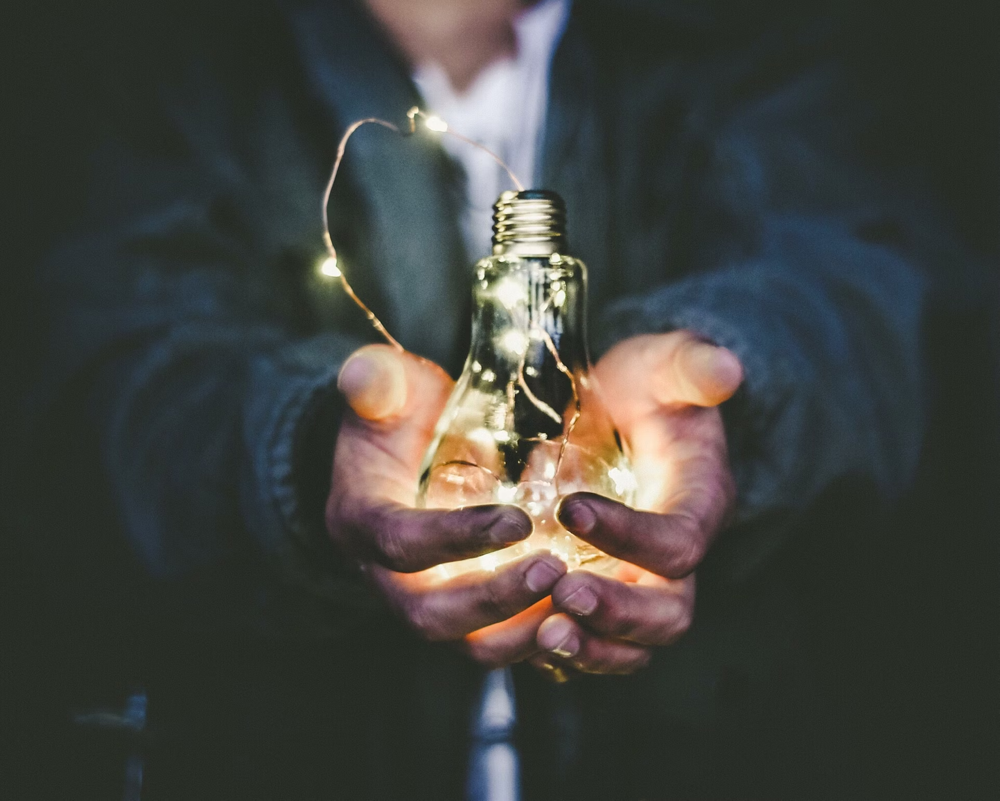

### **CONCLUSION**

Model Logistic Regression dengan hyperparameter tuning yang lebih baik dalam memprediksi kemungkinan calon pemegang polis akan melakukan claim dengan hanya menggunakan 15 fitur setelah melalui tahap data preprocessing dibandingkan menggunakan metode rule based. Hal ini dapat terlihat dari nilai f2 score yang lebih tinggi pada model (0.25) dibandingkan rule based (0.11). Nilai tersebut menandakan model mampu untuk menyeimbangkan nilai recall dan precision yang lebih baik. Hal ini berdampak pada performa bisnis dimana dengan menggunakan model, Perusahaan mampu untuk menekan kerugian sebesar Rp1.293.500.000, 3x Kali lebih rendah dibandingkan menggunakan rule based. 

### **Recommendation**
Rekomendasi penjualan produk :
- Penjualan produk tetap harus dilakukan ke segala umur, karena semakin besar rentang umur yang dapat dicover juga mempengaruhi peningkatan penjualan produk. Namun tetap harus diperhatikan, semakin besar rentang umur yang dapat dicover juga dapat meningkatkan resiko claim, sehingga perlu dilakukan seleksi kepada calon pemegang polis dengan berbagai persyaratan, misalnya riwayat kesehatan dan kriminal pemegang polis, destinasi tujuan, jenis claim yang dapat dicover, dsb. Dibandingkan umur, mungkin jenis kendaraan (travel/pesawat/kereta api/bis), destinasi kunjungan yang lebih spesifik (tak hanya negara, tapi bisa juga nama hotel/penginapan/kota tujuan), bandara/stasiun/halte tempat transit yang akan lebih mempengaruhi status klaim seseorang.
- Perusahaan asuransi harus tetap memasarkan produk asuransi perjalanan melalui agensi airlines dan travel agency karena ada banyak traveler yang melakukan perjalanan tak hanya ke dalam negeri saja namun juga perjalanan penerbangan ke luar negeri. 
- 5 Produk yang memiliki ratio claim paling besar adalah Annual Silver Plan, Annual Gold Plan, Annual Travel Protect Gold, Single Trip Travel Protect Platinum & Spouse or Parents Comprehensive Plan, yang berarti sebagian besar merupakan produk asuransi perjalanan jangka panjang. perusahaan dapat memfokuskan menjual produk kepada selain 5 produk di atas, jika memang keuntungan yang diperoleh juga tidak sesuai target perusahaan.

Hal-hal yang dapat dilakukan untuk mengembangkan model agar lebih baik lagi :
- Menambahkan fitur2 atau kolom2 baru yang berhubungan dengan status claim, seperti nama dan ID pemegang polis, waktu pemesanan produk asuransi, harga produk asuransi, syarat dan ketentuan dari produk asuransi (umur yang dapat dicover, durasi perjalanan yang dapat dicover, dsb agar data cleaning bisa dilakukan secara lebih subjektif)

### **Fit Final Model & Saving**

In [84]:
#Concat train and test features data
data_final_model_X = pd.concat([X_train,X_test])
data_final_model_X

,Agency,Agency Type,Distribution Channel,Product Name,Duration,Destination,Net Sales,Commision (in value),Age
0,RAB,Airlines,Online,Value Plan,4,BRUNEI DARUSSALAM,15.00,6.00,69
1,JZI,Airlines,Online,Value Plan,14,"KOREA, REPUBLIC OF",58.00,20.30,43
2,C2B,Airlines,Online,Annual Gold Plan,417,SINGAPORE,321.75,80.44,43
3,LWC,Travel Agency,Online,Single Trip Travel Protect Gold,21,UNITED KINGDOM,76.50,49.73,22
4,EPX,Travel Agency,Online,Cancellation Plan,3,CHINA,14.00,0.00,33
...,...,...,...,...,...,...,...,...,...
7773,EPX,Travel Agency,Online,2 way Comprehensive Plan,34,"TAIWAN, PROVINCE OF CHINA",22.00,0.00,55
7774,EPX,Travel Agency,Online,2 way Comprehensive Plan,44,INDONESIA,20.00,0.00,31
7775,EPX,Travel Agency,Online,2 way Comprehensive Plan,56,INDONESIA,20.00,0.00,36
7776,C2B,Airlines,Online,Silver Plan,18,SINGAPORE,72.00,18.00,38


In [85]:
#Concat train and test label data
data_final_model_y = pd.concat([y_train,y_test])
data_final_model_y

0       0
1       0
2       0
3       0
4       0
       ..
7773    0
7774    0
7775    0
7776    0
7777    0
Name: Claim, Length: 38887, dtype: int64

In [86]:
# Get the best estimator from GridSearchCV
best_estimator_final = best_estimator

#Fit model ke fitur data train dan test yang sudah disatukan dan label data train dan test yang telah disatukan
best_estimator_final.fit(data_final_model_X,data_final_model_y)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('scaler',
                                                                   RobustScaler())]),
                                                  Index(['Duration', 'Net Sales', 'Commision (in value)', 'Age'], dtype='object')),
                                                 ('ordinal',
                                                  OrdinalEncoder(categories=[['Airlines',
                                                                              'Travel '
                                                                              'Agency']]),
                                                  ['Agency Type']),
                                                 ('ordi...
                                                  OneHotEncoder(drop='first',
                                                                handle_unknown='ignore',
                                                                sparse_output=False),
                                                  ['Agency',
                                                   'Product Name'])])),
                ('sampler', RandomOverSampler(random_state=42)),
                ('feature_selector',
                 SelectFromModel(estimator=LogisticRegression(penalty='l1',
                                                              solver='liblinear'),
                                 max_features=15, threshold='median')),
                ('classifier',
                 LogisticRegression(C=0.01, max_iter=500, random_state=42,
                                    solver='liblinear'))])

In [87]:
import pickle

#Saving models

filename = 'travel-insurance-model.sav'

## Uncomment code dibawah untuk saving file model

## pickle.dump(best_estimator_final,open(filename,'wb'))